<a href="https://colab.research.google.com/github/mafaldasalomao/PAVIC_computer_vision/blob/main/AulaExtra.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
# importaçao das bibliotecas
import cv2 #Opencv
import numpy as np
from matplotlib import pyplot as plt
from google.colab.patches import cv2_imshow

In [3]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [4]:
!cp -R  /content/gdrive/MyDrive/python_img_a_z/ .

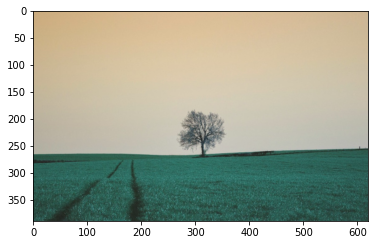

In [5]:
#Limiarização Global (Global Thresholding)
img = cv2.imread('/content/python_img_a_z/imagens/paisagem01.jpg')
plt.imshow(img); # BGR

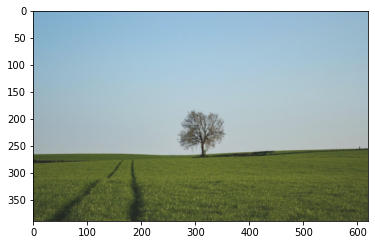

In [6]:
rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(rgb)

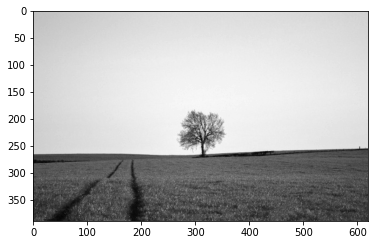

In [7]:
gray = cv2.cvtColor(rgb, cv2.COLOR_RGB2GRAY)
plt.imshow(gray, cmap='gray')

In [8]:
limiar = 180
val, thresh = cv2.threshold(gray, limiar, 255, cv2.THRESH_BINARY)

In [9]:
val, thresh

(180.0, array([[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]], dtype=uint8))

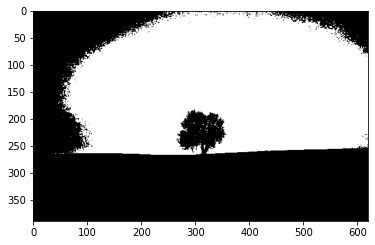

In [10]:
plt.imshow(thresh, cmap='gray')



In [11]:
limiar = 100
val, thresh = cv2.threshold(gray, limiar, 255, cv2.THRESH_BINARY)

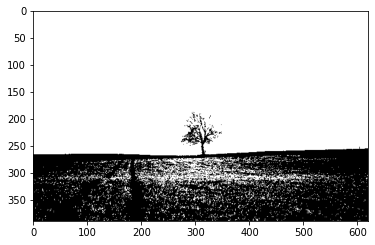

In [12]:
plt.imshow(thresh, cmap='gray')


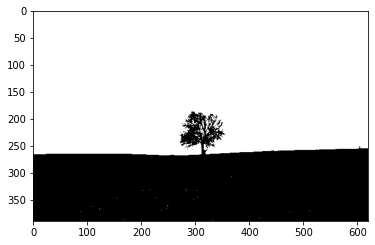

In [13]:
limiar = 141 #@param {type: "slider", min:0, max:255, step:1}
val, thresh = cv2.threshold(gray, limiar, 255, cv2.THRESH_BINARY)
plt.imshow(thresh, cmap='gray')


In [14]:
def mostrar(imagem):
  fig = plt.gcf()
  fig.set_size_inches(18,6)
  plt.imshow(imagem, cmap='gray')
  plt.axis('off')
  plt.show()

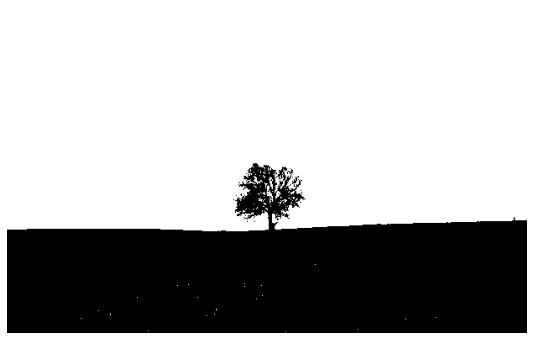

In [15]:
mostrar(thresh)

In [16]:
cv2.imwrite("resultado_thresh.jpg", thresh)

True

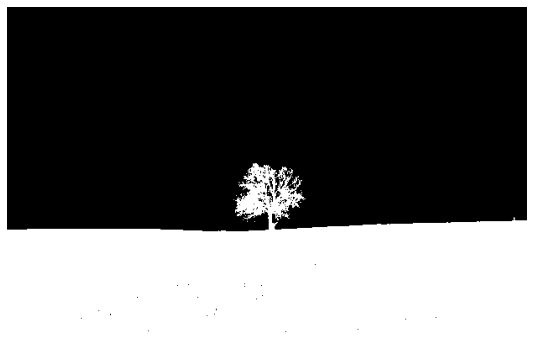

In [17]:
_,thresh = cv2.threshold(gray, limiar, 255, cv2.THRESH_BINARY_INV)
mostrar(thresh)

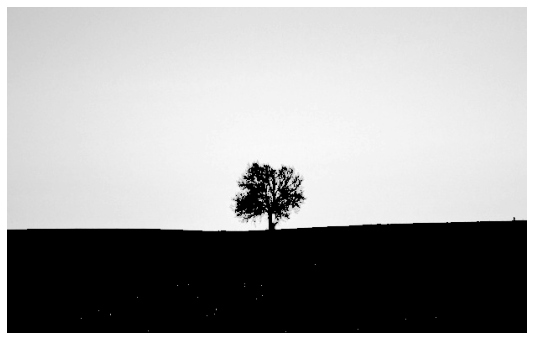

In [18]:
_,thresh = cv2.threshold(gray, limiar, 255, cv2.THRESH_TOZERO)
mostrar(thresh)

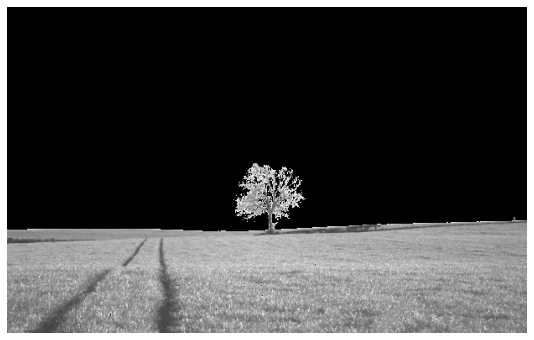

In [19]:
_,thresh = cv2.threshold(gray, limiar, 255, cv2.THRESH_TOZERO_INV)
mostrar(thresh)

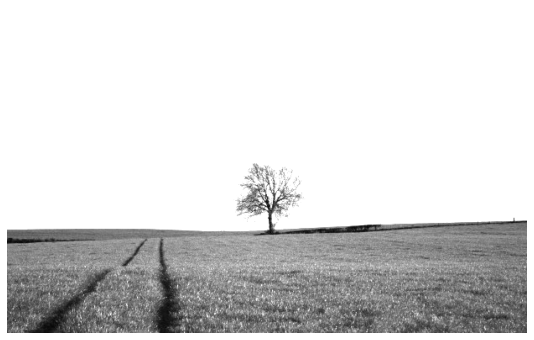

In [20]:
_,thresh = cv2.threshold(gray, limiar, 255, cv2.THRESH_TRUNC)
mostrar(thresh)

In [21]:
def exibir_limiarizacao(img, limiar = 127):
  _, thresh_binary = cv2.threshold(gray, limiar, 255, cv2.THRESH_BINARY)
  _, thresh_binary_inv = cv2.threshold(gray, limiar, 255, cv2.THRESH_BINARY_INV)
  _, thresh_trunc = cv2.threshold(gray, limiar, 255, cv2.THRESH_TRUNC)
  _, thresh_to_zero = cv2.threshold(gray, limiar, 255, cv2.THRESH_TOZERO)
  _, thresh_to_zero_inv = cv2.threshold(gray, limiar, 255, cv2.THRESH_TOZERO_INV)

  titulos = ['Imagem original', 'Binary', 'Binary inv', 'Trunc', 'To zero', 'To zero inv']
  imagens = [img, thresh_binary, thresh_binary_inv, thresh_trunc, thresh_to_zero, thresh_to_zero_inv]

  fig = plt.gcf()
  fig.set_size_inches(18,12)

  for i in range(6):
    plt.subplot(2, 3, i + 1)
    plt.imshow(cv2.cvtColor(imagens[i], cv2.COLOR_BGR2RGB), cmap = 'gray')
    plt.title(titulos[i])
    plt.xticks([]),plt.yticks([])
  plt.show()

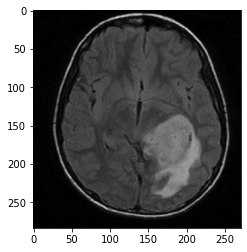

In [22]:
img = cv2.imread("/content/python_img_a_z/imagens/ct-scan.jpg")
gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
plt.imshow(img, cmap='gray');

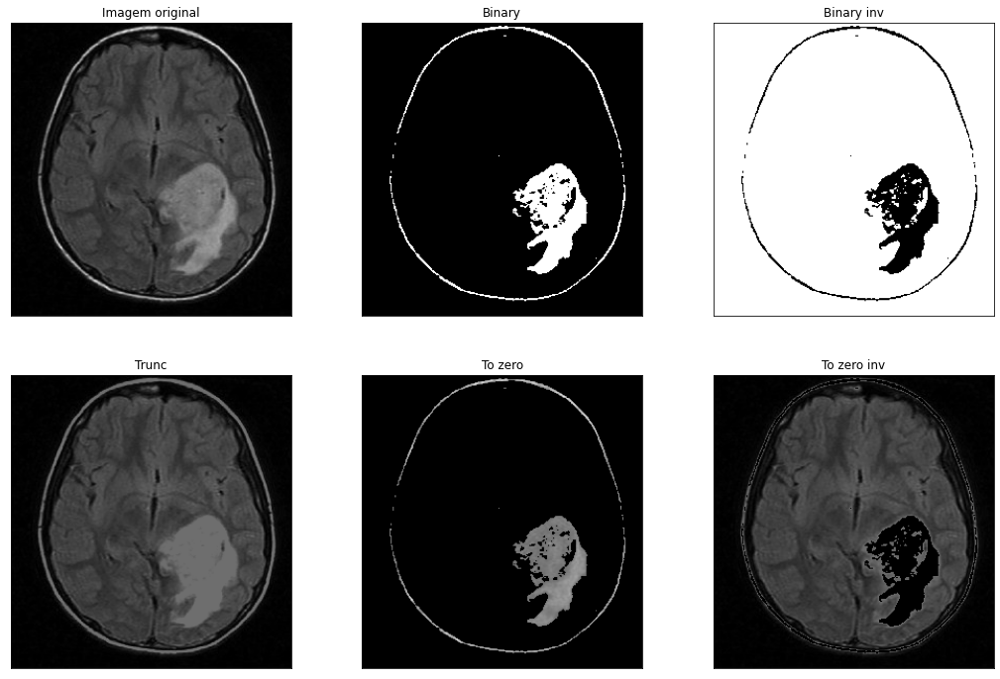

In [23]:
limiar = 110
exibir_limiarizacao(gray, limiar)

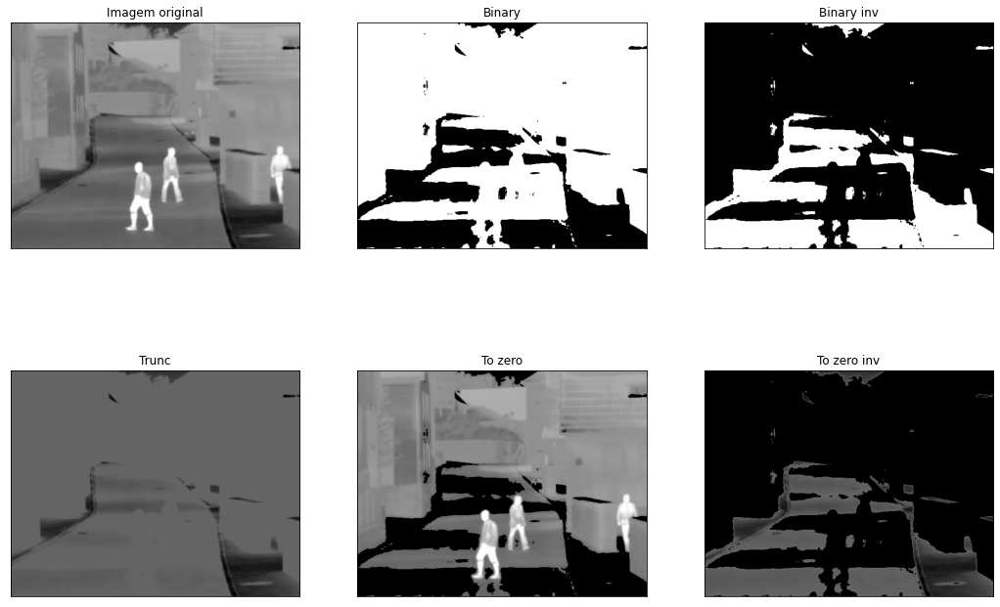

In [24]:
img = cv2.imread("/content/python_img_a_z/imagens/thermal01.jpg")
gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
limiar = 100 #@param {type: "slider", min:0, max: 255, step:1}
exibir_limiarizacao(gray, limiar)

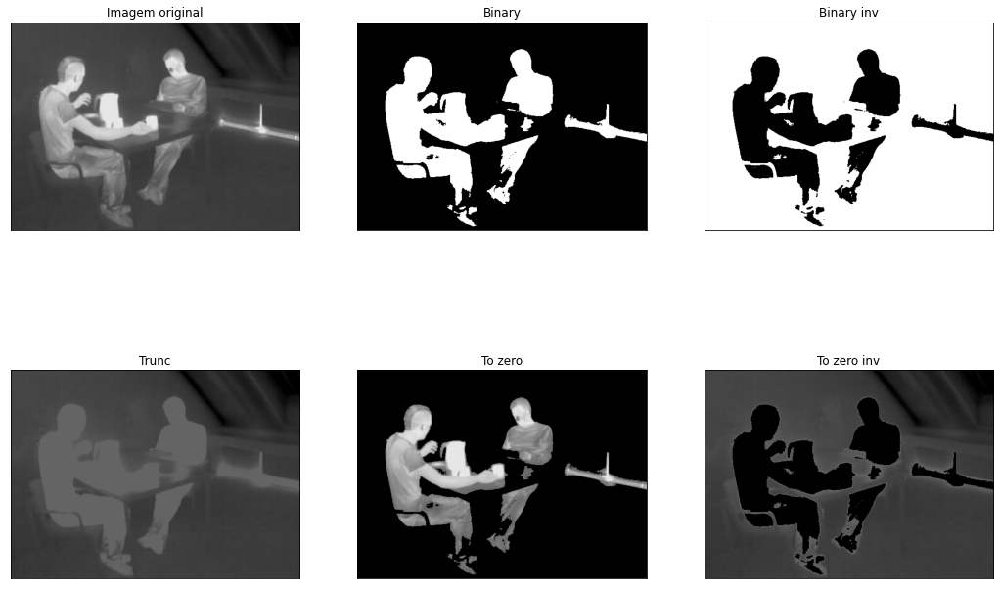

In [25]:
img = cv2.imread("/content/python_img_a_z/imagens/thermal02.jpg")
gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
limiar = 100 #@param {type: "slider", min:0, max: 255, step:1}
exibir_limiarizacao(gray, limiar)

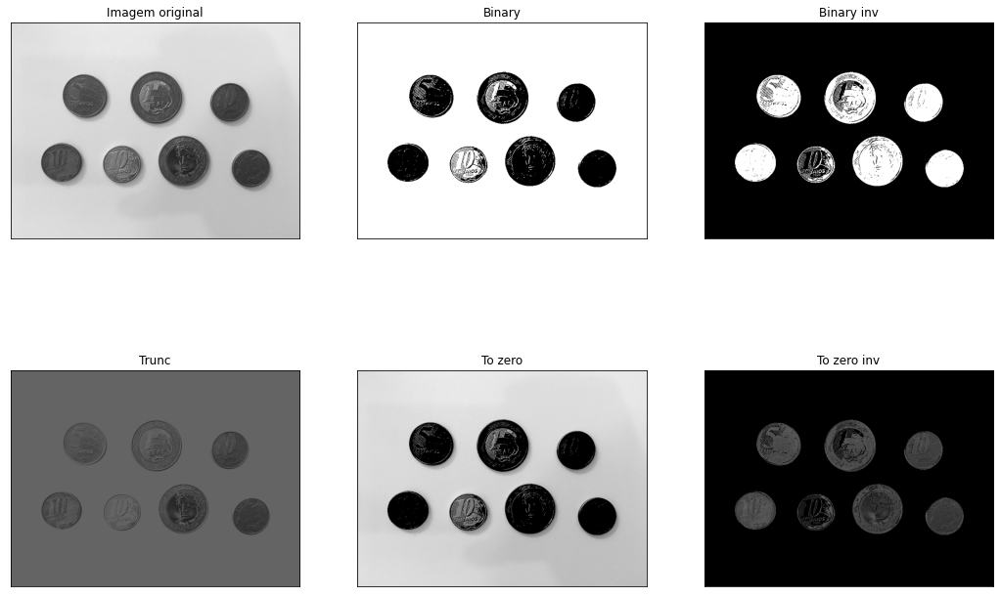

In [26]:
img = cv2.imread("/content/python_img_a_z/imagens/moedas01.jpg")
gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
limiar = 100 #@param {type: "slider", min:0, max: 255, step:1}
exibir_limiarizacao(gray, limiar)

In [27]:
img = cv2.imread("/content/python_img_a_z/imagens/paisagem01.jpg")
gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
val, otsu = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)
val

136.0

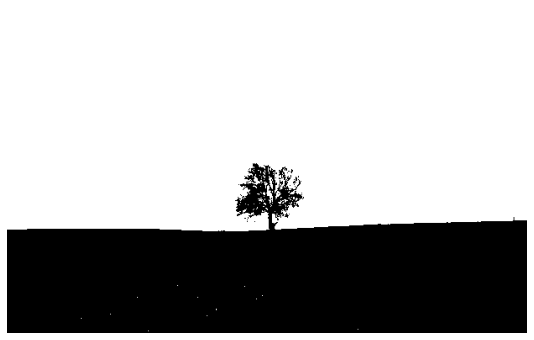

In [28]:
mostrar(otsu)

In [29]:
histograma, bins = np.histogram(gray, 256, [0, 256])
histograma

array([   0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          3,    3,   15,   36,   54,   88,  127,  164,  205,  253,  231,
        201,  190,  214,  211,  220,  216,  239,  260,  254,  297,  329,
        399,  454,  475,  568,  645,  701,  775,  839,  957, 1077, 1136,
       1260, 1364, 1424, 1583, 1680, 1778, 1884, 1949, 2054, 2304, 2328,
       2452, 2512, 2630, 2590, 2607, 2563, 2580, 2583, 2418, 2406, 2354,
       2206, 2124, 2018, 1824, 1595, 1559, 1365, 1158, 1007,  865,  683,
        610,  508,  435,  364,  313,  245,  244,  200,  190,  140,  142,
        133,  130,   84,  122,   83,   88,   75,   90,   66,   62,   66,
         58,   62,   76,   52,   61,   69,   57,   52,   54,   53,   58,
         48,   54,   66,   48,   60,   66,   55,   55,   44,   59,   72,
         52,   59,   52,   54,   48,   53,   50,   

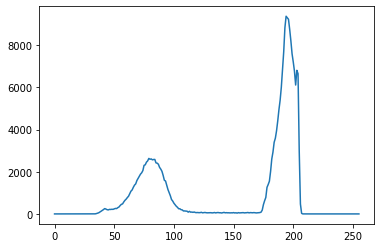

In [30]:
plt.plot(histograma);

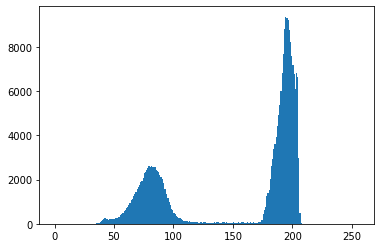

In [31]:
histograma = gray.ravel()
plt.hist(histograma, 256, [0,256]);

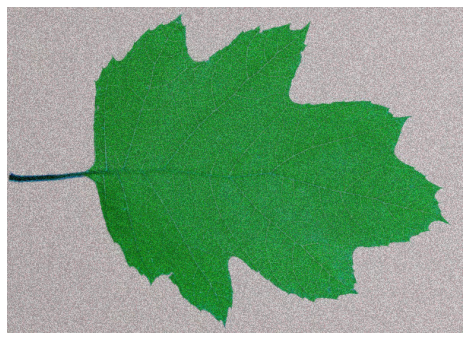

Text(0.5, 1.0, 'Histograma')

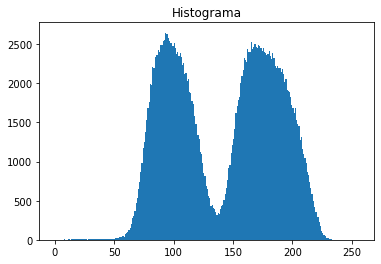

In [32]:
img = cv2.imread("/content/python_img_a_z/imagens/folha_ruido.jpg")
gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
mostrar(img)
plt.hist(gray.ravel(), 256, [0,256])
plt.title("Histograma")

In [33]:
valor, otsu = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)
valor

138.0

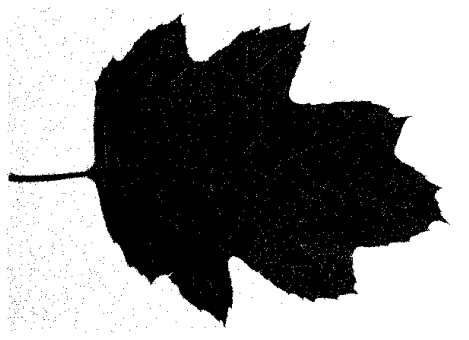

In [34]:
mostrar(otsu)

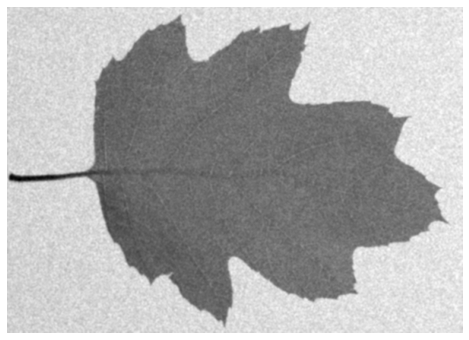

In [35]:
img_new = cv2.GaussianBlur(gray, (5,5), 0)
mostrar(img_new)

Valor do limiar:  138.0


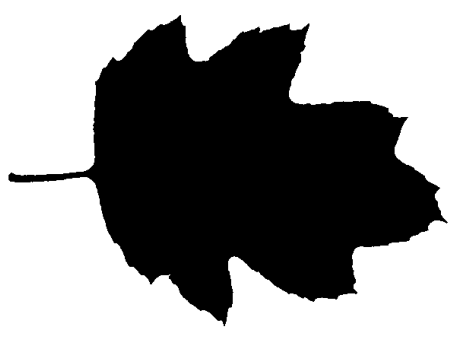

In [36]:
valor, otsu = cv2.threshold(img_new, 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)
print('Valor do limiar: ', valor)
mostrar(otsu)

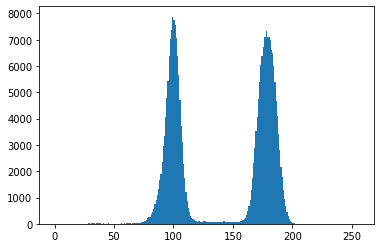

In [37]:
plt.hist(img_new.ravel(),256,[0,256]);

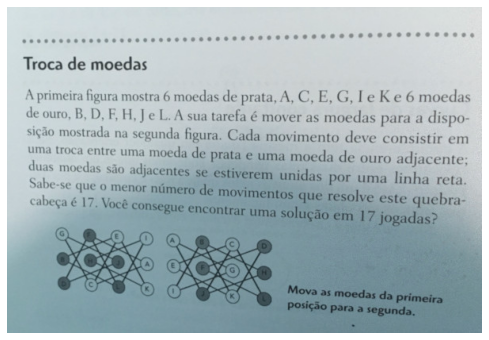

In [38]:
img = cv2.imread("/content/python_img_a_z/imagens/livro-texto.jpg")
mostrar(img)

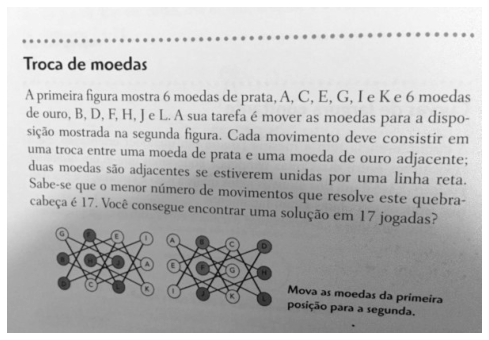

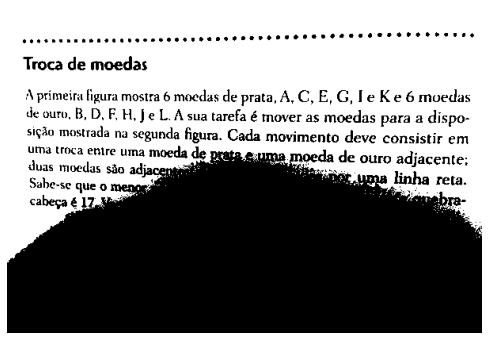

In [39]:
gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
mostrar(gray)
valor, otsu = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)
mostrar(otsu)

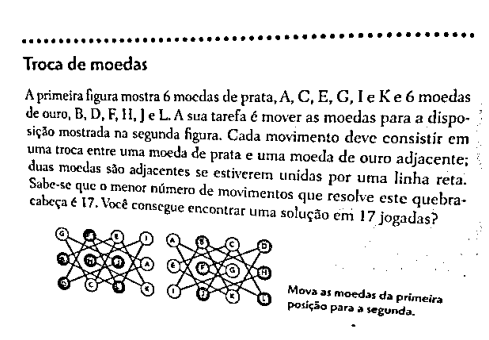

In [40]:
adapt_media = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 11, 9) #11 neighboar 
mostrar(adapt_media)

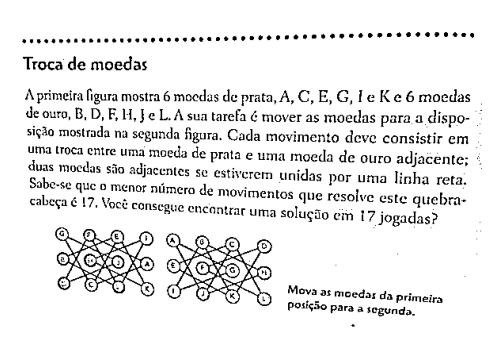

In [41]:
adapt_gauss = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 9)
mostrar(adapt_gauss)

In [42]:
def limiarizacao_adapt(img, limiar = 140, block_size=11, c = 9):
  _, limiar_global = cv2.threshold(img, limiar, 255, cv2.THRESH_BINARY)
  limiar_media = cv2.adaptiveThreshold(img, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, block_size, c)
  limiar_gauss = cv2.adaptiveThreshold(img, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, block_size, c)
  imgs = [img, limiar_global, limiar_media, limiar_gauss]
  titles=['Imagem Original', 'Limiarização Global', 'Limiarização adaptativa - mean', 'Limiarização adaptativa - Gauss']
  fig = plt.gcf()
  fig.set_size_inches(18,12)
  for i in range(4):
    plt.subplot(2, 2, i + 1)
    plt.imshow(cv2.cvtColor(imgs[i], cv2.COLOR_BGR2RGB), cmap='gray')
    plt.title(titles[i])
    plt.xticks([])
    plt.yticks([])

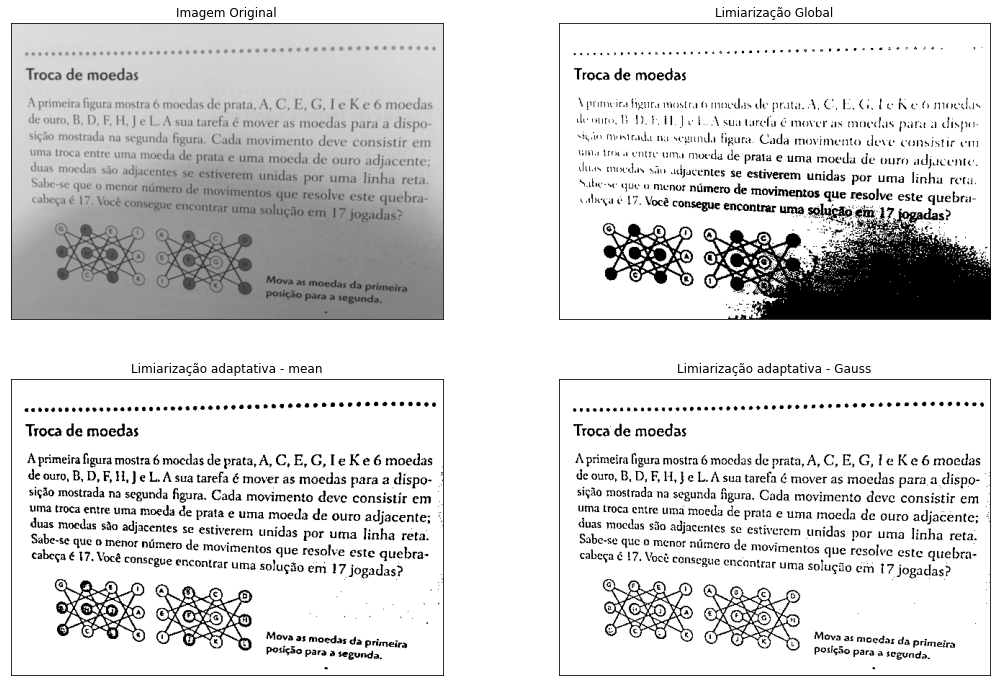

In [43]:
limiarizacao_adapt(gray)

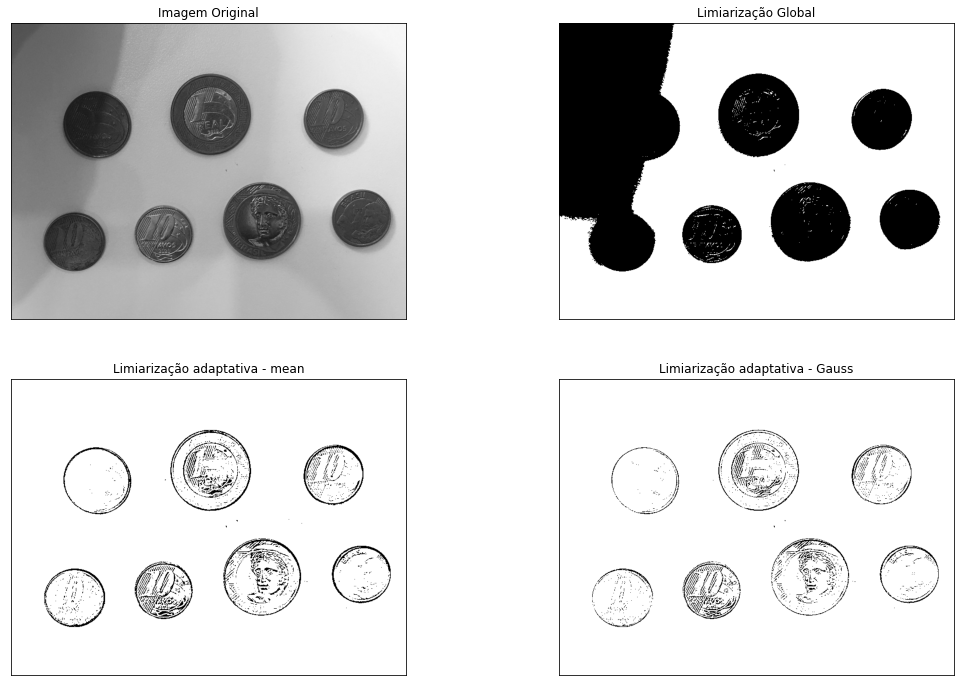

In [44]:
img = cv2.imread('/content/python_img_a_z/imagens/moedas02.jpg')
gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
limiarizacao_adapt(gray, c=15)

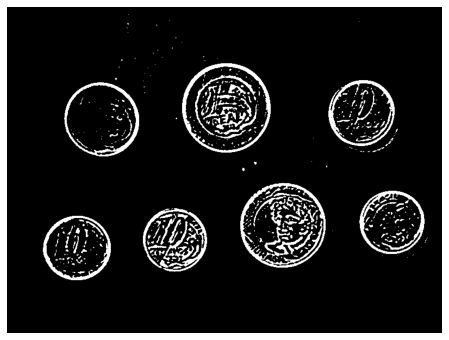

In [45]:
img_processada = img.copy()
desfoque = cv2.GaussianBlur(gray, (7,7), 0)
adapt_gauss = cv2.adaptiveThreshold(desfoque, 255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV, 15, 3)
mostrar(adapt_gauss)

In [46]:
kernel = np.ones((3,3), np.uint8)

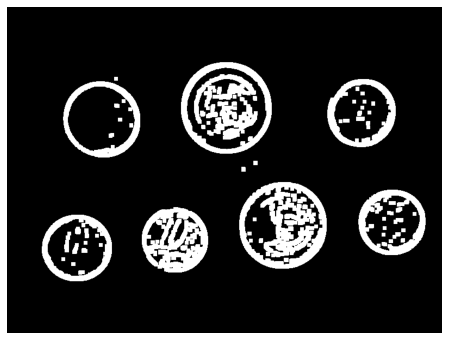

In [47]:
erosao = cv2.erode(adapt_gauss, kernel)
dilatacao = cv2.dilate(erosao, kernel, iterations=3)
mostrar(dilatacao)

In [48]:
elementos = dilatacao.copy()
contornos, hierarquia = cv2.findContours(elementos, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)


In [49]:
print(contornos)

(array([[[118, 383]],

       [[117, 384]],

       [[113, 384]],

       [[112, 385]],

       [[109, 385]],

       [[108, 386]],

       [[106, 386]],

       [[105, 387]],

       [[103, 387]],

       [[102, 388]],

       [[101, 388]],

       [[100, 389]],

       [[ 99, 389]],

       [[ 98, 390]],

       [[ 97, 390]],

       [[ 96, 391]],

       [[ 95, 391]],

       [[ 93, 393]],

       [[ 92, 393]],

       [[ 91, 394]],

       [[ 90, 394]],

       [[ 86, 398]],

       [[ 85, 398]],

       [[ 84, 399]],

       [[ 84, 400]],

       [[ 82, 402]],

       [[ 81, 402]],

       [[ 80, 403]],

       [[ 80, 404]],

       [[ 77, 407]],

       [[ 77, 408]],

       [[ 75, 410]],

       [[ 75, 411]],

       [[ 72, 414]],

       [[ 72, 415]],

       [[ 71, 416]],

       [[ 71, 417]],

       [[ 70, 418]],

       [[ 70, 420]],

       [[ 69, 421]],

       [[ 69, 422]],

       [[ 68, 423]],

       [[ 68, 425]],

       [[ 67, 426]],

       [[ 67, 427]],

       [[

12382.0
11422.0
11712.0
20271.0
15536.5
12287.5
22199.0


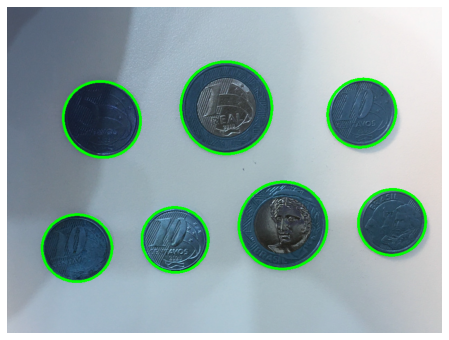

In [50]:
for cnt in contornos:
  area = cv2.contourArea(cnt)
  if len(cnt)> 5:
    print(area)
    elipse = cv2.fitEllipse(cnt)
    cv2.ellipse(img_processada, elipse, (0, 255,0), 3)
mostrar(img_processada)

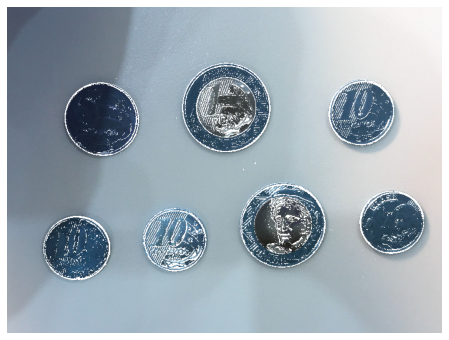

In [51]:
adapt_gauss = cv2.adaptiveThreshold(gray, 255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV, 15, 11)
sobrepor = cv2.add(img, cv2.cvtColor(adapt_gauss, cv2.COLOR_GRAY2BGR))
mostrar(sobrepor)

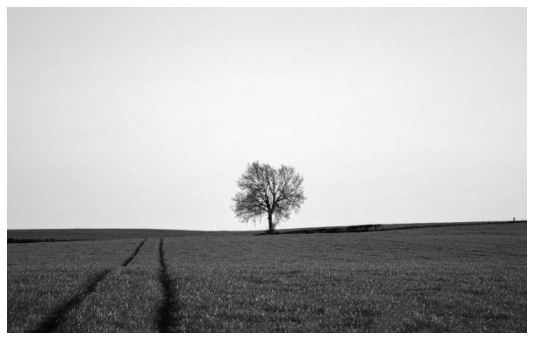

In [52]:
img = cv2.imread("/content/python_img_a_z/imagens/paisagem01.jpg")
gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
mostrar(gray)

In [53]:
desfoque = cv2.GaussianBlur(gray, (5,5), 0)

In [54]:
# Primeira maneira
k_sobelX = np.array(([-1, 0, 1],
                     [-2, 0, 2],
                     [-1, 0, 1]), np.float32)
k_sobelY = np.array(([-1, -2, -1],
                     [0, 0, 0],
                     [1, 2, 1]), np.float32)
sobel_x = cv2.filter2D(desfoque, cv2.CV_64F, k_sobelX)
sobel_y = cv2.filter2D(desfoque, cv2.CV_64F, k_sobelY)

In [55]:
# Segunda maneira
sobel_x = cv2.Sobel(desfoque, cv2.CV_64F, 1, 0, ksize = 3)
sobel_y = cv2.Sobel(desfoque, cv2.CV_64F, 0, 1, ksize = 3)

In [56]:
sobel_x = cv2.convertScaleAbs(sobel_x)
sobel_y = cv2.convertScaleAbs(sobel_y)

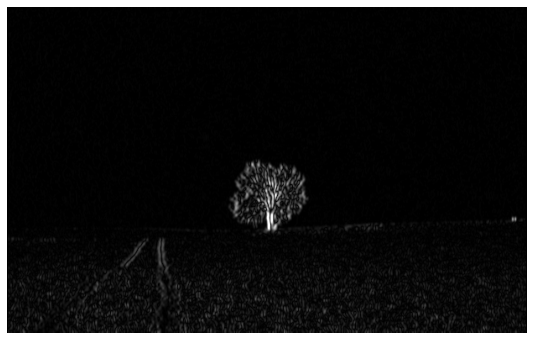

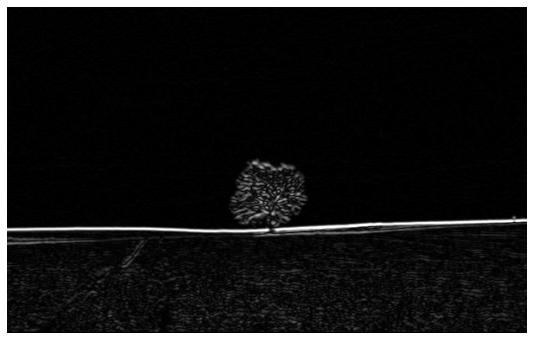

In [57]:
mostrar(sobel_x)
mostrar(sobel_y)

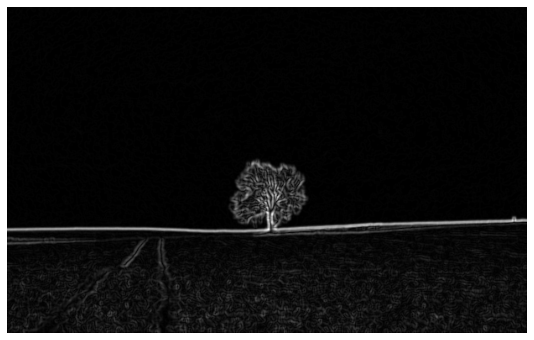

In [58]:
sobel = cv2.addWeighted(src1 = sobel_x, alpha=0.5, src2 = sobel_y, beta=0.5, gamma=0)
mostrar(sobel)

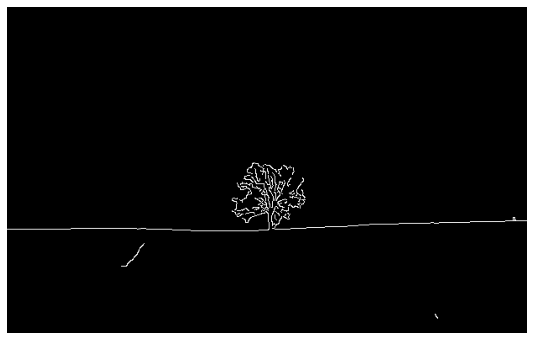

In [59]:
canny = cv2.Canny(desfoque, 80, 140)
mostrar(canny)

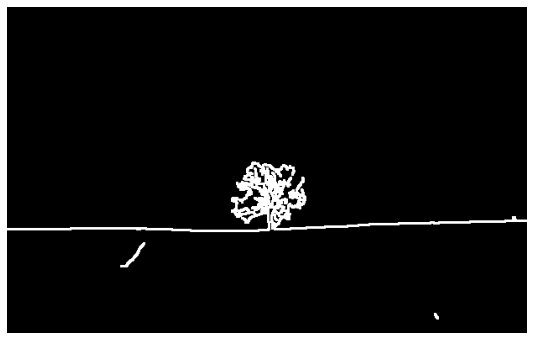

In [60]:
dilatacao = cv2.dilate(canny, np.ones((3,3), np.uint8))

mostrar(dilatacao)

In [61]:
def segmentacao_bordas(img):
  desfoque = cv2.GaussianBlur(img, (5, 5), 0)
  
  sobel_x = cv2.Sobel(desfoque, cv2.CV_64F, 1, 0, ksize=3)
  sobel_y = cv2.Sobel(desfoque, cv2.CV_64F, 0, 1, ksize=3)
  sobel_x = cv2.convertScaleAbs(sobel_x)
  sobel_y = cv2.convertScaleAbs(sobel_y)
  sobel = cv2.addWeighted(src1=sobel_x, alpha=0.5, src2=sobel_y, beta=0.5, gamma=0)

  canny = cv2.Canny(desfoque, 80, 140)

  kernel = np.ones((3, 3), np.uint8)
  dilatacao = cv2.dilate(canny, kernel, iterations=2)
  erosao = cv2.erode(dilatacao, kernel, iterations=1)

  imagens = [img, sobel, canny, erosao]
  titulos = ['Imagem Original', 'Sobel', 'Canny Edge', 'Canny Edge + Fechamento']

  fig = plt.gcf()
  fig.set_size_inches(18, 12)

  for i in range(4):
      plt.subplot(2,2,i+1)
      plt.imshow(cv2.cvtColor(imagens[i], cv2.COLOR_BGR2RGB), 'gray')
      plt.title(titulos[i])
      plt.xticks([]),plt.yticks([]) 
      plt.subplots_adjust(wspace=0.1) 

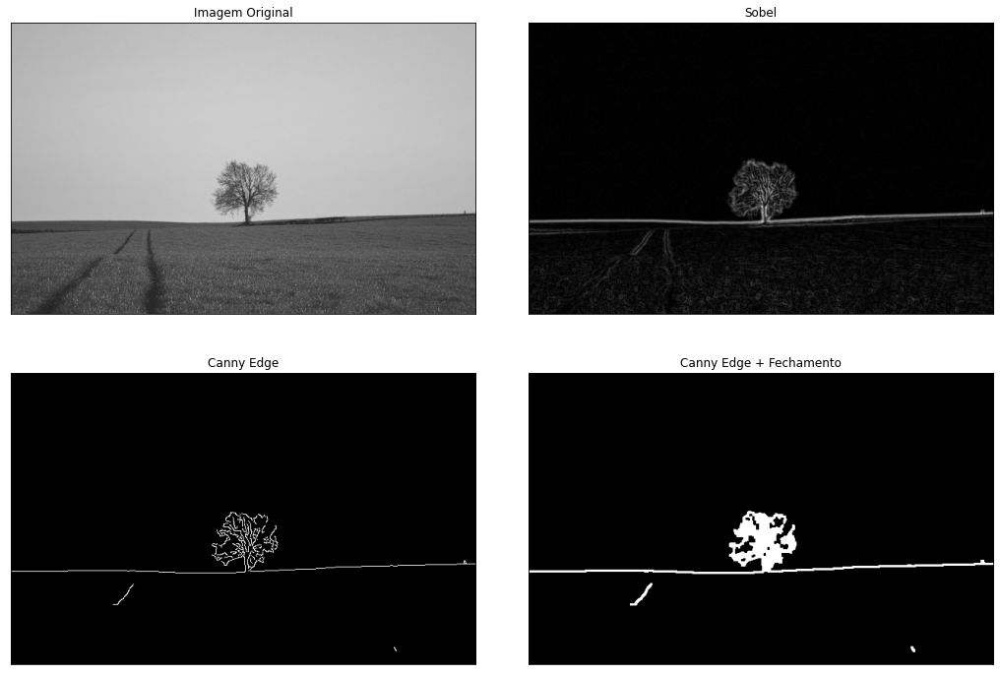

In [62]:
segmentacao_bordas(gray)

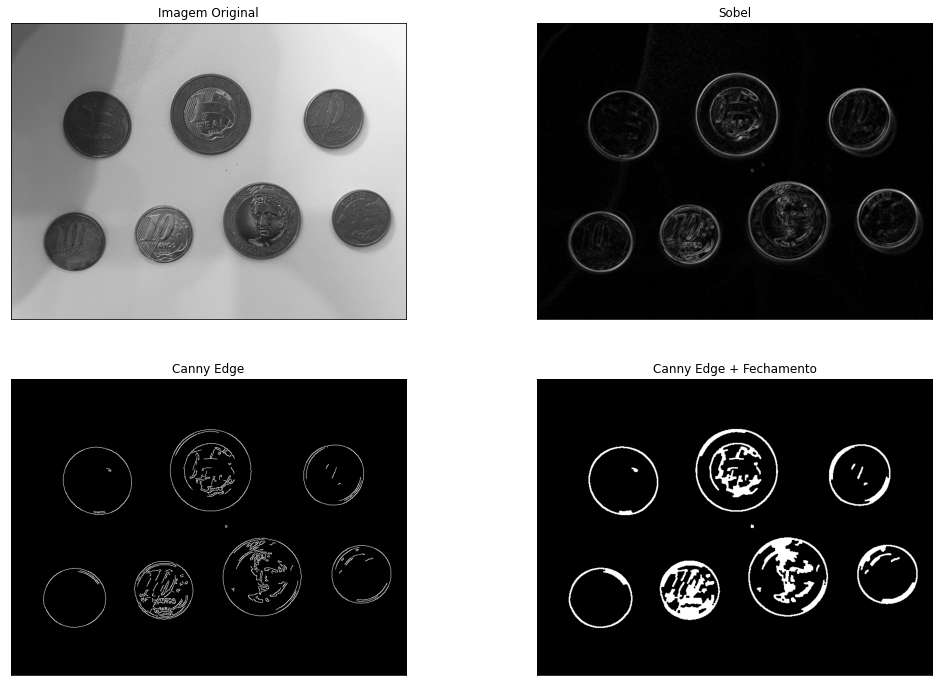

In [63]:
img = cv2.imread("/content/python_img_a_z/imagens/moedas02.jpg")
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
segmentacao_bordas(gray)

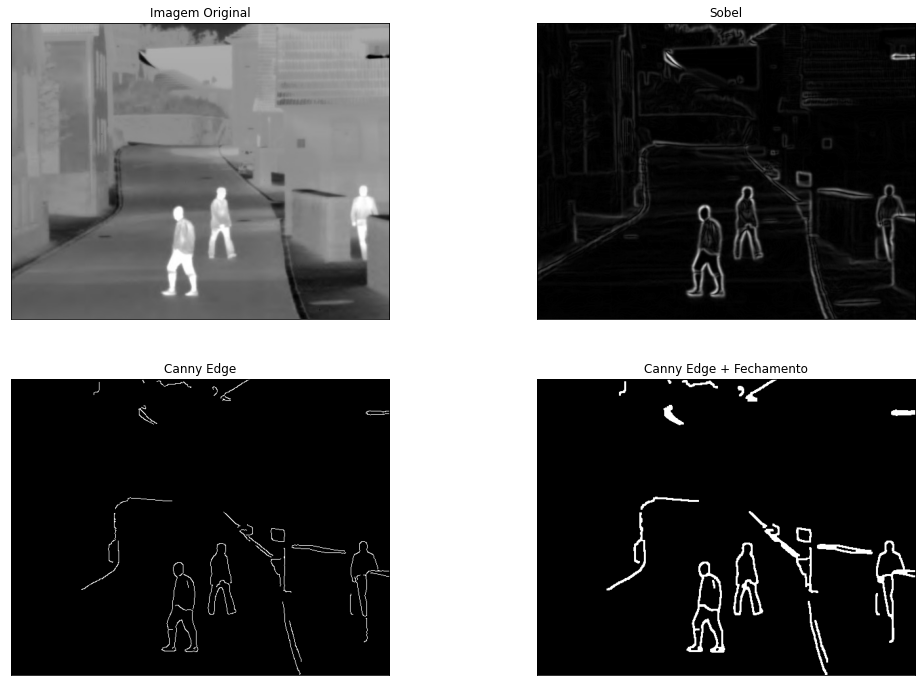

In [64]:
img = cv2.imread("/content/python_img_a_z/imagens/thermal01.jpg")
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
segmentacao_bordas(gray)

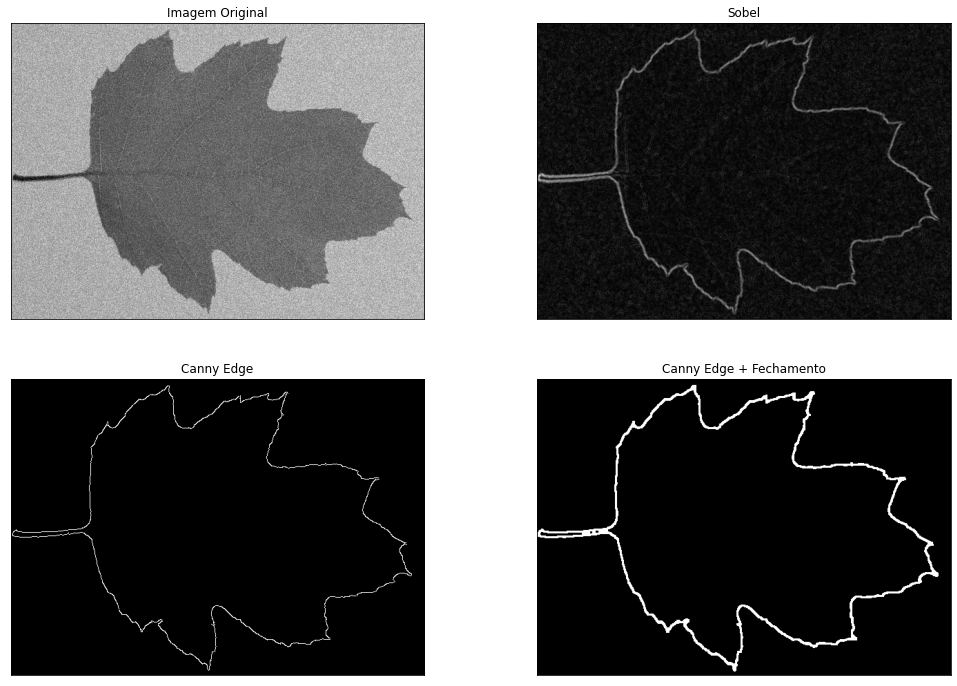

In [65]:
img = cv2.imread("/content/python_img_a_z/imagens/folha_ruido.jpg")
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
segmentacao_bordas(gray)

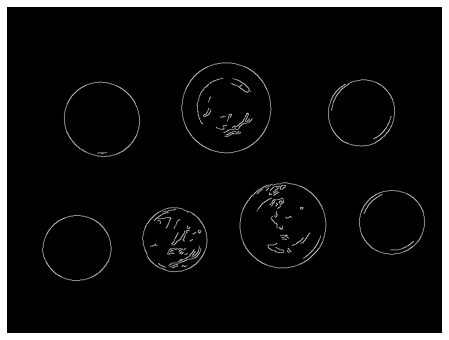

In [66]:
img = cv2.imread("/content/python_img_a_z/imagens/moedas02.jpg")
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
desfoque = cv2.GaussianBlur(gray, (7, 7), 0)
canny = cv2.Canny(desfoque, 80, 140)
mostrar(canny)

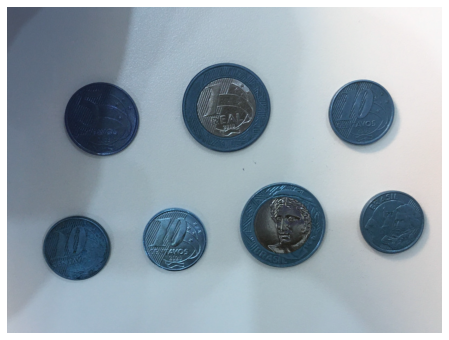

In [67]:
mostrar(img)

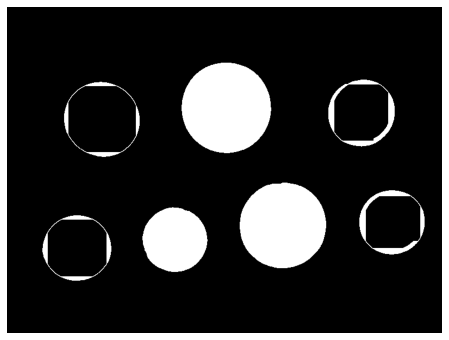

In [68]:
kernel = np.ones((5, 5), np.uint8)
dilatacao = cv2.dilate(canny, kernel, iterations=14)
erosao = cv2.erode(dilatacao, kernel, iterations=14)
mostrar(erosao)

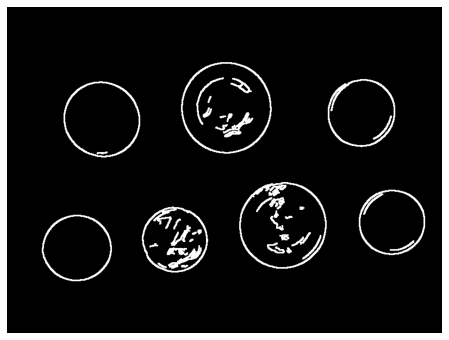

In [69]:
dilatacao = cv2.dilate(canny, np.ones((3, 3), np.uint8), iterations=1)
mostrar(dilatacao)

In [70]:
contornos, hierarquia = cv2.findContours(dilatacao, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)

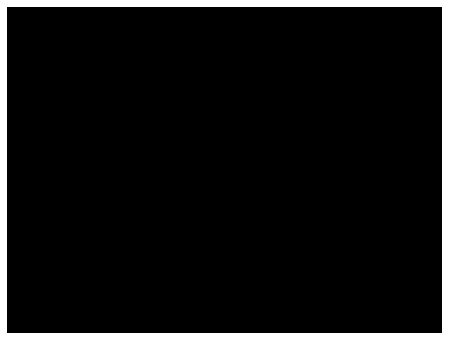

In [71]:
mascara = np.zeros((img.shape[0], img.shape[1]), dtype = np.uint8)
mostrar(mascara)

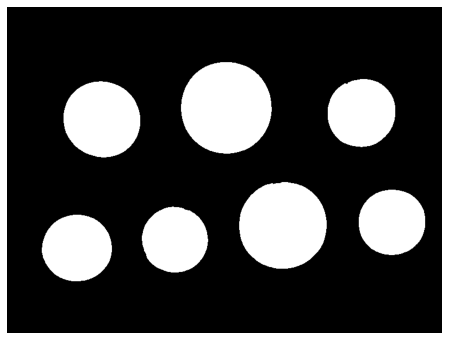

In [72]:
cv2.drawContours(mascara, contornos, -1, color = (255,255,255), thickness=cv2.FILLED)
mostrar(mascara)

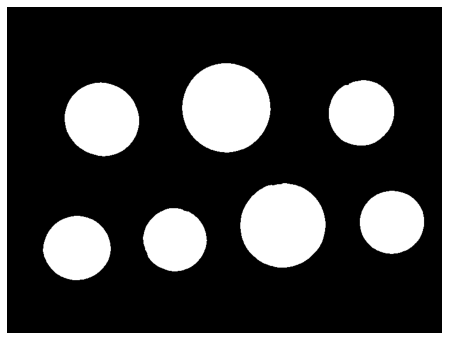

In [73]:
mascara = cv2.erode(mascara, np.ones((3,3), np.uint8), iterations=2)
mostrar(mascara)

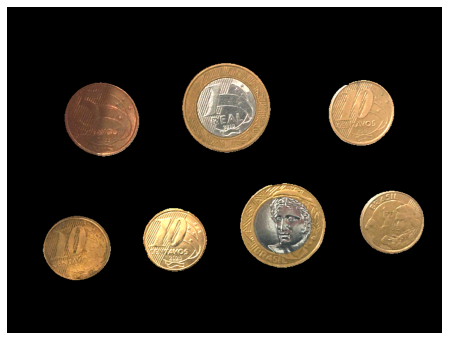

In [74]:
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img_final = cv2.add(img, img, mask=mascara)
mostrar(img_final)

In [75]:
img = cv2.imread('/content/python_img_a_z/imagens/paisagem01.jpg')
img.shape

(389, 620, 3)

In [76]:
altura, largura = img.shape[:2]
altura, largura

(389, 620)

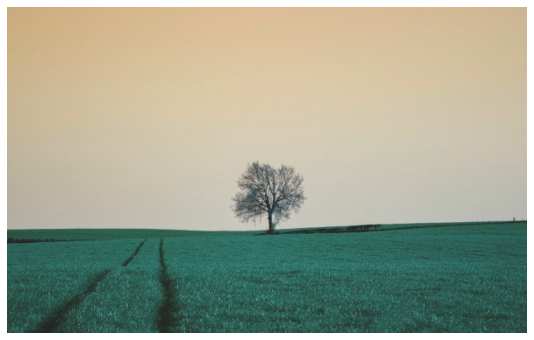

In [77]:
mostrar(img)

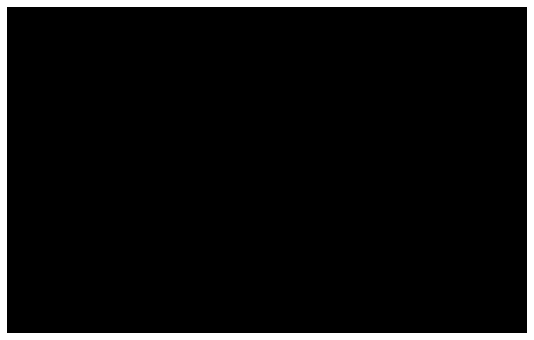

In [78]:
mascara = np.zeros((altura, largura), np.uint8)
mostrar(mascara)

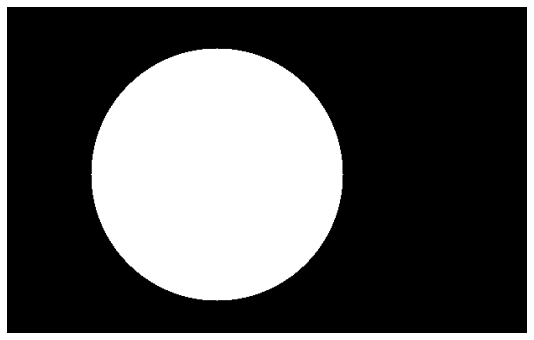

In [79]:
cv2.circle(mascara, (250, 200), 150, 255, -1)
mostrar(mascara)

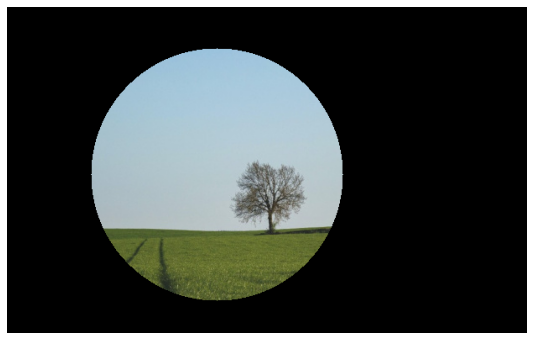

In [80]:
img_final = cv2.bitwise_and(cv2.cvtColor(img, cv2.COLOR_BGR2RGB), cv2.cvtColor(img, cv2.COLOR_BGR2RGB), mask=mascara)
mostrar(img_final)

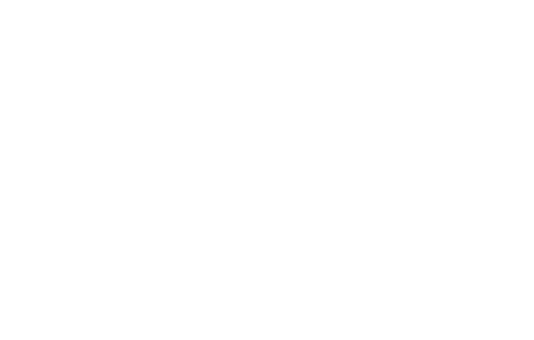

In [81]:
fundo_branco = 255 * np.ones((altura, largura, 3), dtype='uint8')
mostrar(fundo_branco)

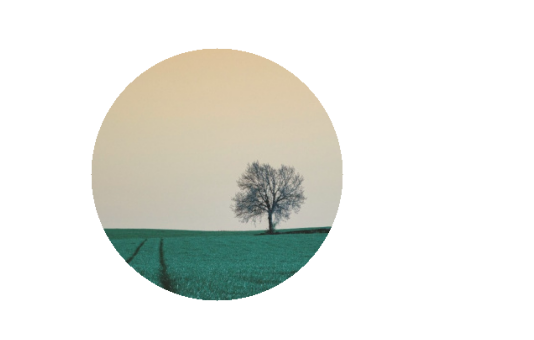

In [82]:
img_final = img.copy()

img_final[mascara==0] = fundo_branco[mascara==0]
mostrar(img_final)

In [83]:
fundo_ = cv2.imread('/content/python_img_a_z/imagens/montanha.jpg')
fundo = cv2.resize(fundo_, (largura, altura))

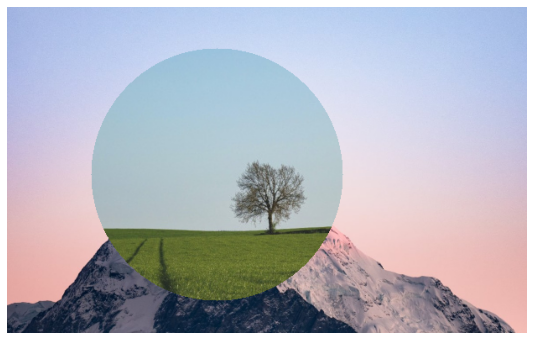

In [84]:
img_final[mascara==0] = fundo[mascara==0]
mostrar(cv2.cvtColor(img_final, cv2.COLOR_BGR2RGB))

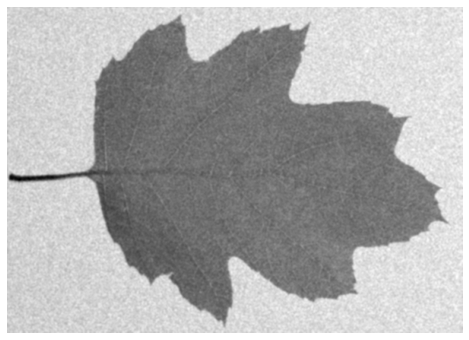

In [85]:
img = cv2.imread("/content/python_img_a_z/imagens/folha_ruido.jpg")
altura, largura = img.shape[:2]
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
desfoque = cv2.GaussianBlur(gray, (5, 5), 0)
mostrar(desfoque)

139.0


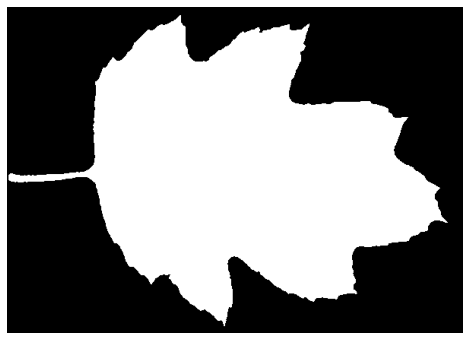

In [86]:
valor, mascara = cv2.threshold(desfoque, 0, 255, cv2.THRESH_BINARY_INV | cv2.THRESH_OTSU)
print(valor)
mostrar(mascara)

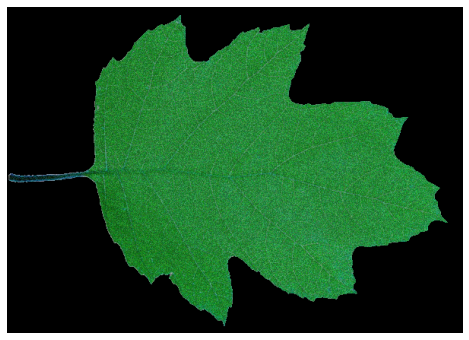

In [87]:
img_final = cv2.bitwise_and(img, img, mask=mascara)
mostrar(img_final)

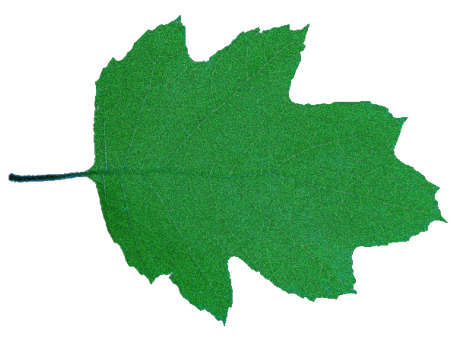

In [88]:
fundo_branco = 255 * np.ones((altura, largura, 3), dtype='uint8')
img_final = img.copy()
img_final[mascara == 0] = fundo_branco[mascara == 0]
mostrar(img_final)

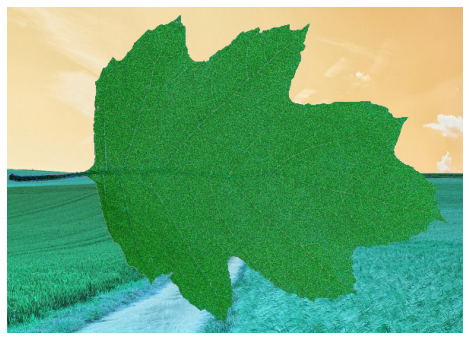

In [89]:
fundo = cv2.imread("/content/python_img_a_z/imagens/paisagem03.jpg")
fundo = cv2.resize(fundo, (largura, altura))
img_final[mascara == 0] = fundo[mascara == 0]
mostrar(img_final)

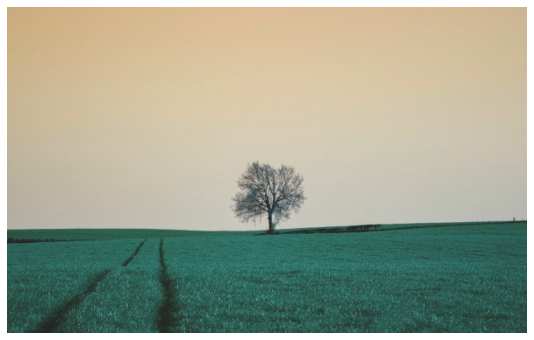

In [90]:
img = cv2.imread("/content/python_img_a_z/imagens/paisagem01.jpg")
mostrar(img)

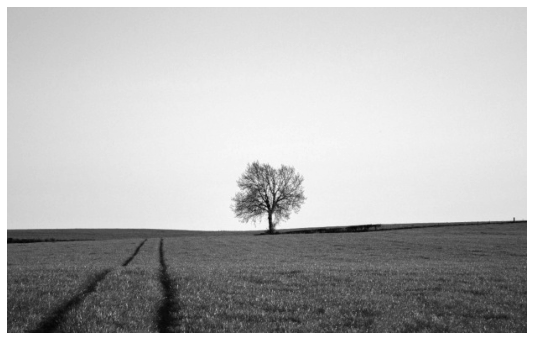

In [91]:
altura, largura = img.shape[0], img.shape[1]
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
mostrar(gray)


In [95]:
img_flat = gray.reshape(altura*largura)

In [92]:
389*620

241180

In [96]:
print(img_flat)
print(img_flat.shape)

[156 158 159 ...  66  60  62]
(241180,)


In [97]:
media = img_flat.mean()
media

152.5262874201841

In [98]:
num_pixels = len(img_flat)
num_pixels

241180

In [99]:
for i in range(num_pixels):
  if img_flat[i] > media:
    img_flat[i] = 255
  else:
    img_flat[i] = 0

In [100]:
img_flat

array([255, 255, 255, ...,   0,   0,   0], dtype=uint8)

In [101]:
seg_regiao = img_flat.reshape(altura, largura)
seg_regiao.shape

(389, 620)

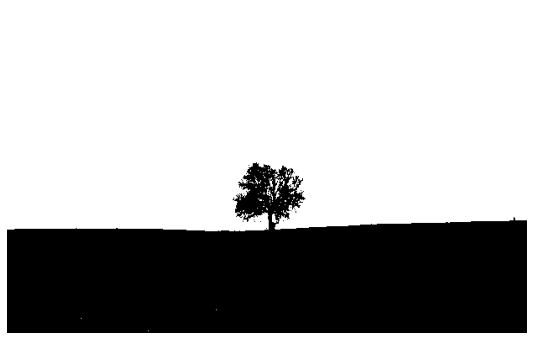

In [102]:
mostrar(seg_regiao)

In [103]:
def flatten_img(img):
  altura, largura = img.shape[0], img.shape[1]
  img_flat = img.reshape(altura*largura)
  return img_flat

In [104]:
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
flatten_img(gray)
print(img_flat)
print(img_flat.shape)
print('Média: ' + str(img_flat.mean()))

[255 255 255 ...   0   0   0]
(241180,)
Média: 168.54233352682644


In [105]:
from skimage.color import rgb2gray

In [106]:
gray = rgb2gray(img)
img_flat = flatten_img(gray)
print(img_flat)
print(img_flat.shape)
print('Média: ' + str(img_flat.mean()))

[0.6640902  0.67193333 0.6758549  ... 0.2539749  0.23211216 0.23995529]
(241180,)
Média: 0.6144771479539324


In [107]:
# 2 regiões
def segment2regioes(img):
  pixels = flatten_img(img).copy()
  media = pixels.mean()
  for i in range(len(pixels)):
    if pixels[i]> media:
      pixels[i] = 255
    else:
      pixels[i] = 0
  
  seg_regiao = pixels.reshape(img.shape[0], img.shape[1])
  return seg_regiao

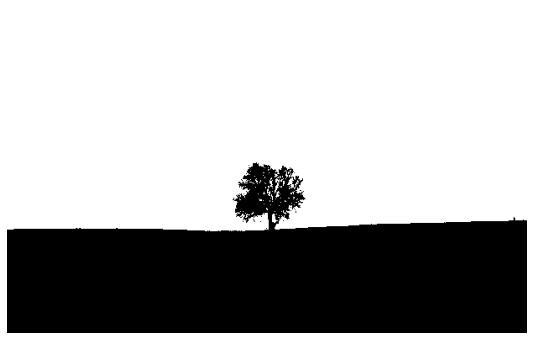

In [108]:
seg_regiao = segment2regioes(gray)
mostrar(seg_regiao)

In [109]:
1/3 # 0-0.33, 0.34-0.66 0.67-1.0

0.3333333333333333

In [110]:
# 3 regioes
def segment3regioes(img):
  pixels = flatten_img(img).copy()
  media = pixels.mean()
  for i in range(len(pixels)):
    if pixels[i]> 0.66:
      pixels[i] = 2
    elif pixels[i] > 0.33:
      pixels[i] = 1
    else:
      pixels[i] = 0
  
  seg_regiao = pixels.reshape(img.shape[0], img.shape[1])
  return seg_regiao

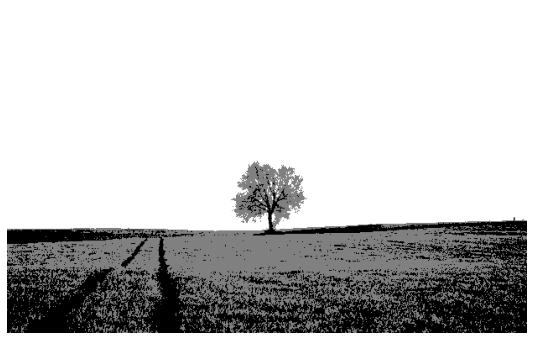

In [111]:
seg_regiao = segment3regioes(gray)
mostrar(seg_regiao)

In [112]:
1/4

0.25

In [115]:
def segment4regioes(img):
  pixels = flatten_img(img).copy()
  for i in range(len(pixels)):
    if pixels[i] > 0.75:
      pixels[i] = 3
    elif pixels[i] > 0.5:
      pixels[i] = 2
    elif pixels[i] > 0.25:
      pixels[i] = 1
    else:
      pixels[i] = 0
  seg_regiao = pixels.reshape(img.shape[0], img.shape[1])
  return seg_regiao

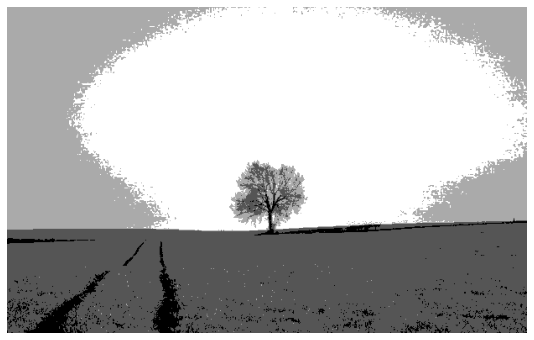

In [116]:
seg_regiao = segment4regioes(gray)
mostrar(seg_regiao)

In [117]:
def segment5regioes(img):
  pixels = flatten_img(img).copy()
  for i in range(len(pixels)):
    if pixels[i] > 0.8:
      pixels[i] = 4
    elif pixels[i] > 0.6:
      pixels[i] = 3
    elif pixels[i] > 0.4:
      pixels[i] = 2
    elif pixels[i] > 0.2:
      pixels[i] = 1
    else:
      pixels[i] = 0
  seg_regiao = pixels.reshape(img.shape[0], img.shape[1])
  return seg_regiao

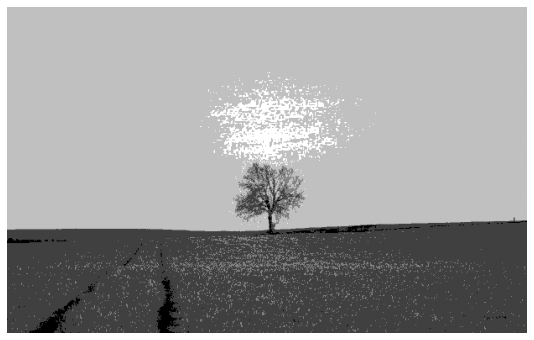

In [118]:
seg_regiao = segment5regioes(gray)
mostrar(seg_regiao)

In [121]:
def segmentacao_regiao(img, cmap='gray'):
  original = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  gray = rgb2gray(img)
  segment2R = segment2regioes(gray)
  segment3R = segment3regioes(gray)
  segment4R = segment4regioes(gray)
  segment5R = segment5regioes(gray)
  
  titulos = ['Imagem Original', '2 Regiões', '3 Regiões', '4 Regiões', '5 Regiões', 'Original (1 canal)']
  imagens = [original, segment2R, segment3R, segment4R, segment5R, gray]

  fig = plt.gcf()
  fig.set_size_inches(18, 10)  
  for i in range(6):
      plt.subplot(2,3,i+1)
      plt.imshow(imagens[i], cmap) 
      plt.title(titulos[i]) 
      plt.xticks([]),plt.yticks([])
      
  plt.subplots_adjust(wspace=0.05)
  plt.show()

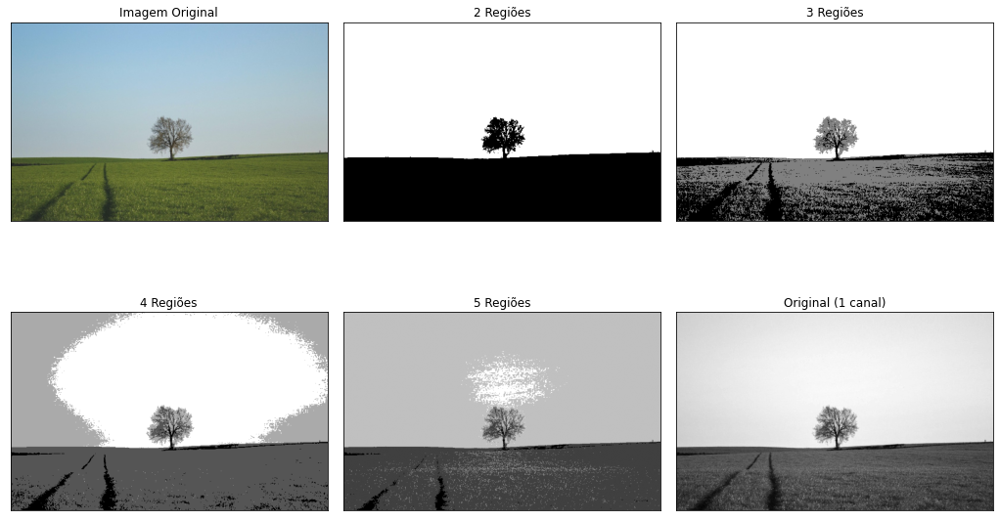

In [122]:
segmentacao_regiao(img)

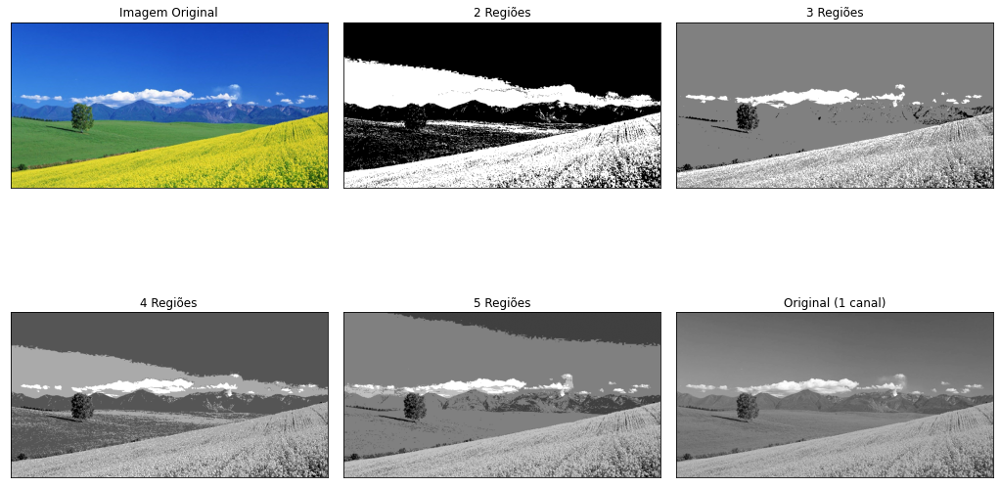

In [123]:
img = cv2.imread("/content/python_img_a_z/imagens/paisagem02.jpg")
segmentacao_regiao(img)

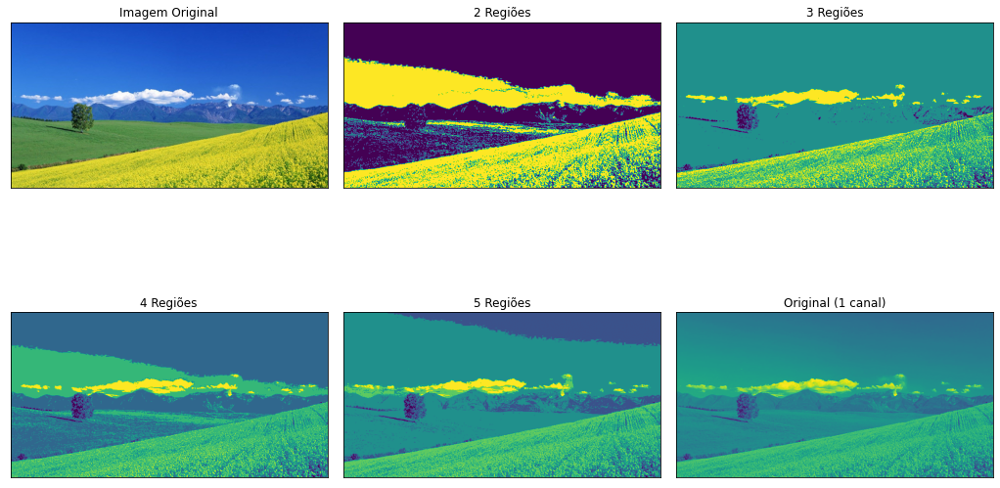

In [124]:
segmentacao_regiao(img, cmap='viridis')

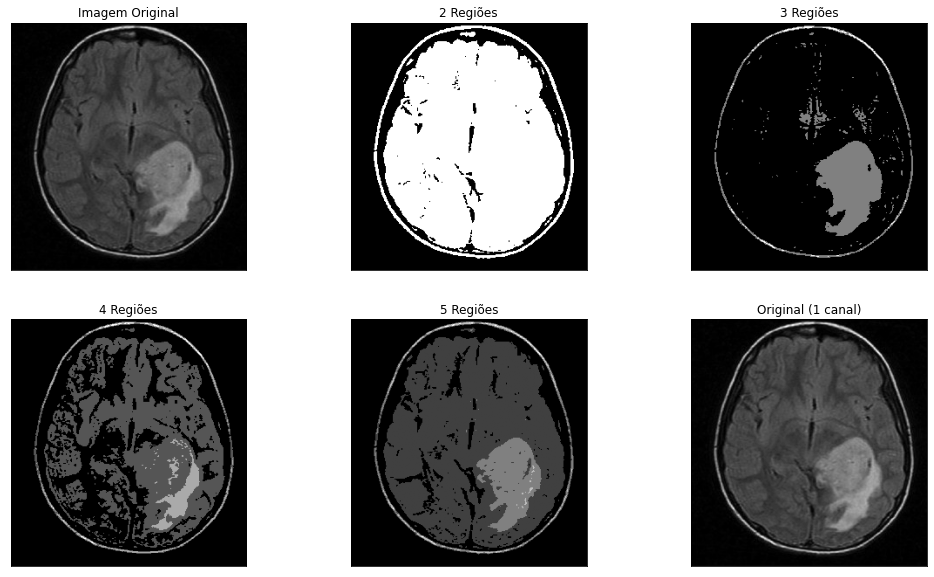

In [125]:
img = cv2.imread("/content/python_img_a_z/imagens/ct-scan.jpg")
segmentacao_regiao(img)

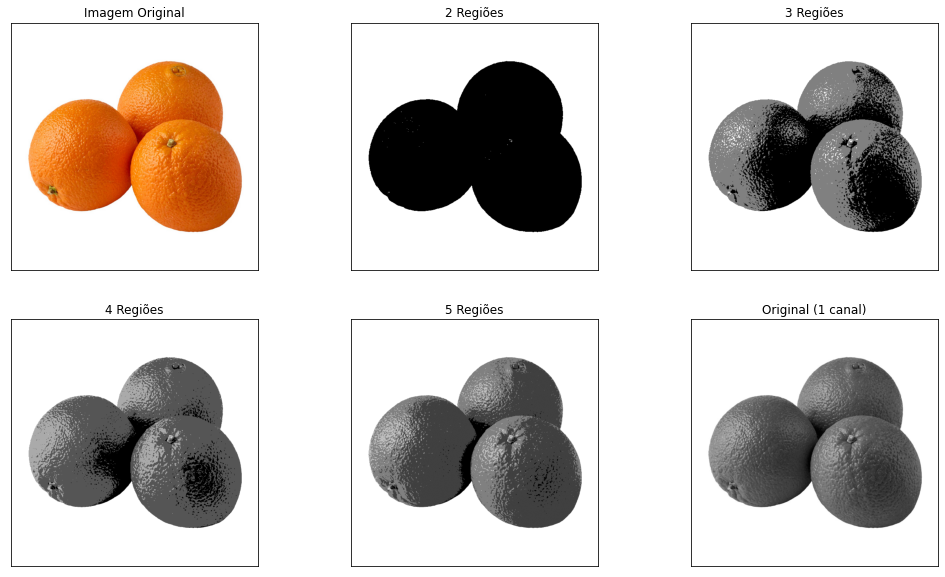

In [126]:
img = cv2.imread("/content/python_img_a_z/imagens/laranjas.jpg")
segmentacao_regiao(img)

## K-MEANS

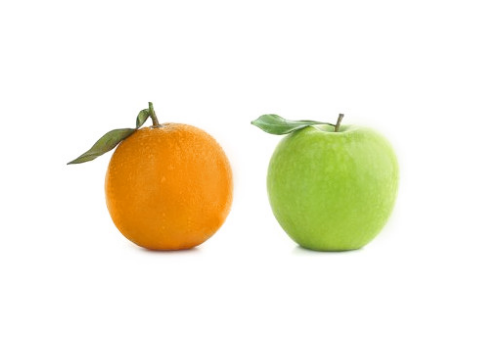

(334, 500, 3)

In [129]:
img = cv2.imread("/content/python_img_a_z/imagens/frutas.jpg")
mostrar(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
img.shape

In [130]:
334*500

167000

In [131]:
vetorizado = img.reshape((-1, 3))
vetorizado.shape

(167000, 3)

In [132]:
vetorizado = np.float32(vetorizado)

In [133]:
criterio = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 10, 1.0)

In [134]:
ret, label, centros = cv2.kmeans(vetorizado, 3, None, criterio, 10, cv2.KMEANS_RANDOM_CENTERS)


In [135]:
print(ret)

66691163.58572686


In [137]:
print(label), len(label)

[[2]
 [2]
 [2]
 ...
 [2]
 [2]
 [2]]


(None, 167000)

In [138]:
print(centros)

[[ 14.406983 133.79312  225.93048 ]
 [ 84.77781  190.10513  166.05893 ]
 [254.4694   255.06332  255.06282 ]]


In [140]:
centros = np.uint8(centros)
centros

array([[ 14, 133, 225],
       [ 84, 190, 166],
       [254, 255, 255]], dtype=uint8)

In [141]:
img_final = centros[label.flatten()]

In [142]:
img_final

array([[254, 255, 255],
       [254, 255, 255],
       [254, 255, 255],
       ...,
       [254, 255, 255],
       [254, 255, 255],
       [254, 255, 255]], dtype=uint8)

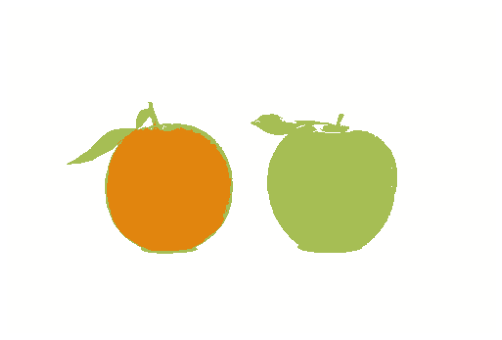

In [145]:
img_final = img_final.reshape(img.shape)
mostrar(cv2.cvtColor(img_final, cv2.COLOR_BGR2RGB))

In [146]:
def segmentacao_cluster(img, k):
  vetorizado = np.float32(img).reshape(-1,3)
  criterio = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER,20,1.0)
  ret,label,centros = cv2.kmeans(vetorizado, k , None, criterio,10,cv2.KMEANS_RANDOM_CENTERS)
  centros = np.uint8(centros)
  img_final = centros[label.flatten()]
  img_final = img_final.reshape(img.shape)
  return img_final

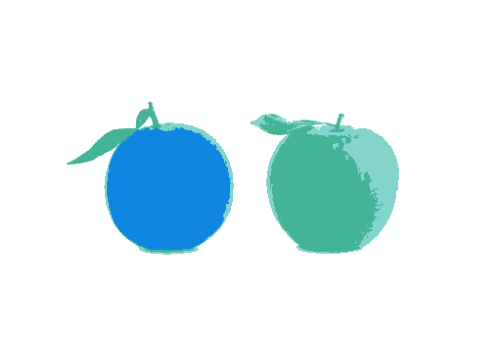

In [147]:
seg_cluster = segmentacao_cluster(img, 4)
mostrar(seg_cluster)

In [148]:
def segmentacao_clustering(img):
  titulos = ['Imagem original']
  imagens = [img]

  segmentacoes = 6
  for k in range(2, segmentacoes + 1):
    titulo = 'k = ' + str(k)
    titulos.append(titulo)
    seg = segmentacao_cluster(img, k)
    imagens.append(seg)

  fig = plt.gcf()
  fig.set_size_inches(18, 12)  
  for i in range(6):
      plt.subplot(2,3,i+1)
      plt.imshow(cv2.cvtColor(imagens[i], cv2.COLOR_BGR2RGB))
      plt.title(titulos[i]) 
      plt.xticks([]),plt.yticks([]) 
      
  plt.subplots_adjust(wspace=0.05)
  plt.show()

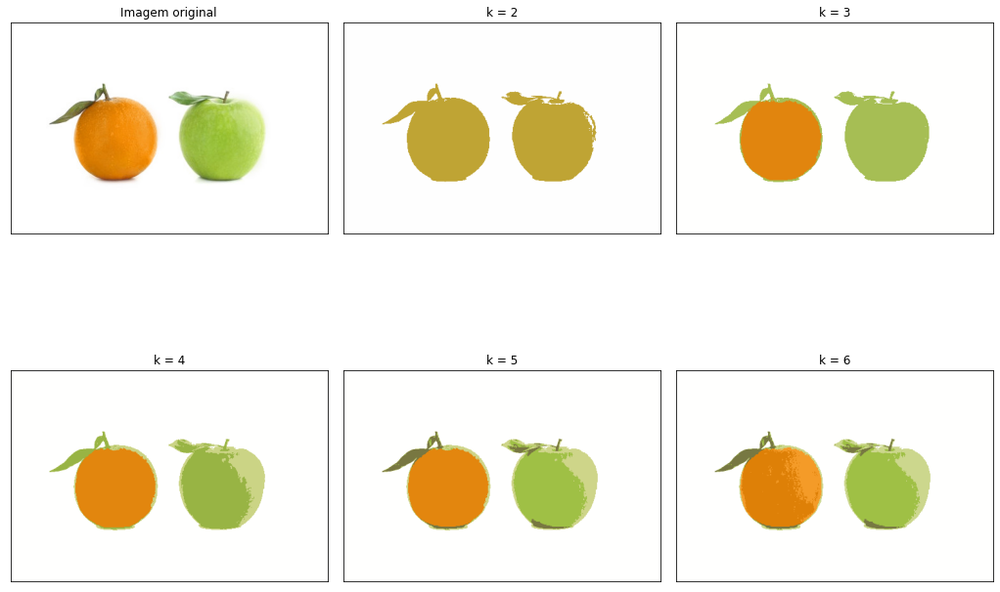

In [149]:
segmentacao_clustering(img)

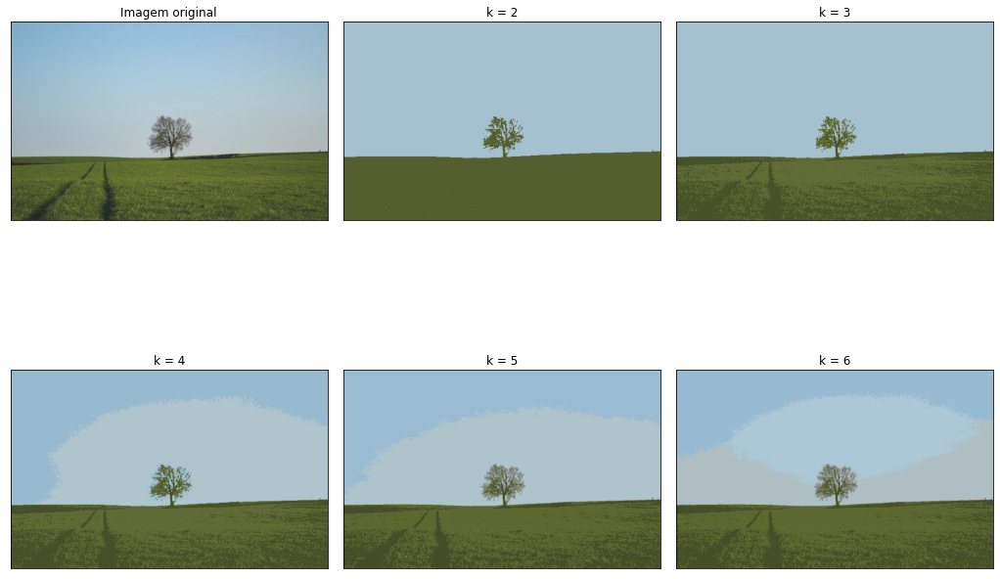

In [150]:
img = cv2.imread("/content/python_img_a_z/imagens/paisagem01.jpg")
segmentacao_clustering(img)

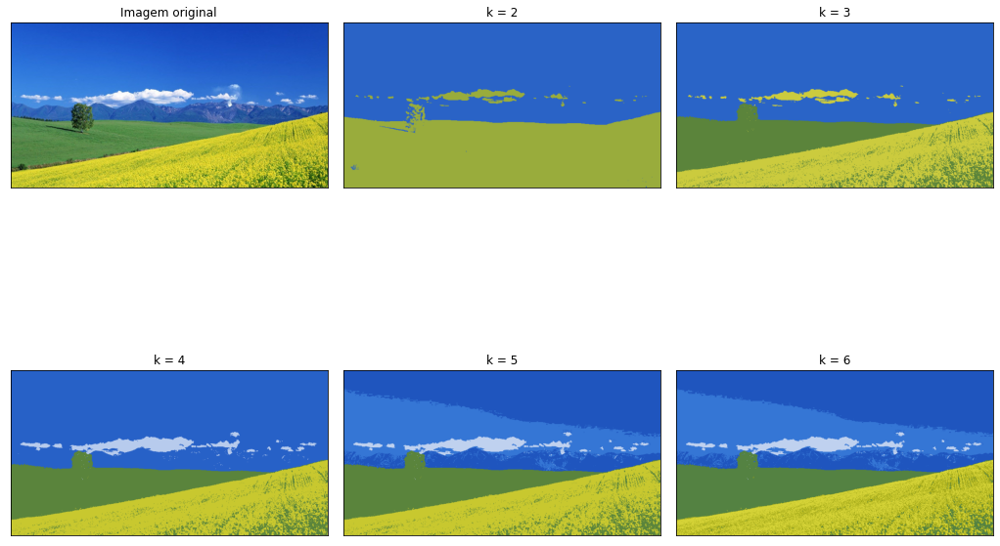

In [151]:
img = cv2.imread("/content/python_img_a_z/imagens/paisagem02.jpg")
segmentacao_clustering(img)

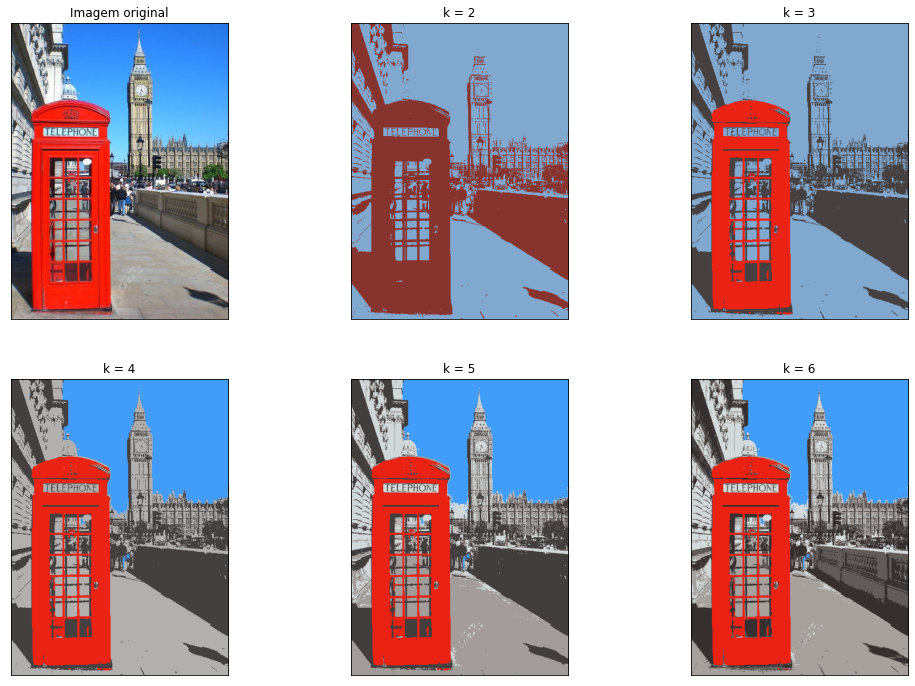

In [152]:
img = cv2.imread("/content/python_img_a_z/imagens/london-red-phonebox.jpg")
segmentacao_clustering(img)

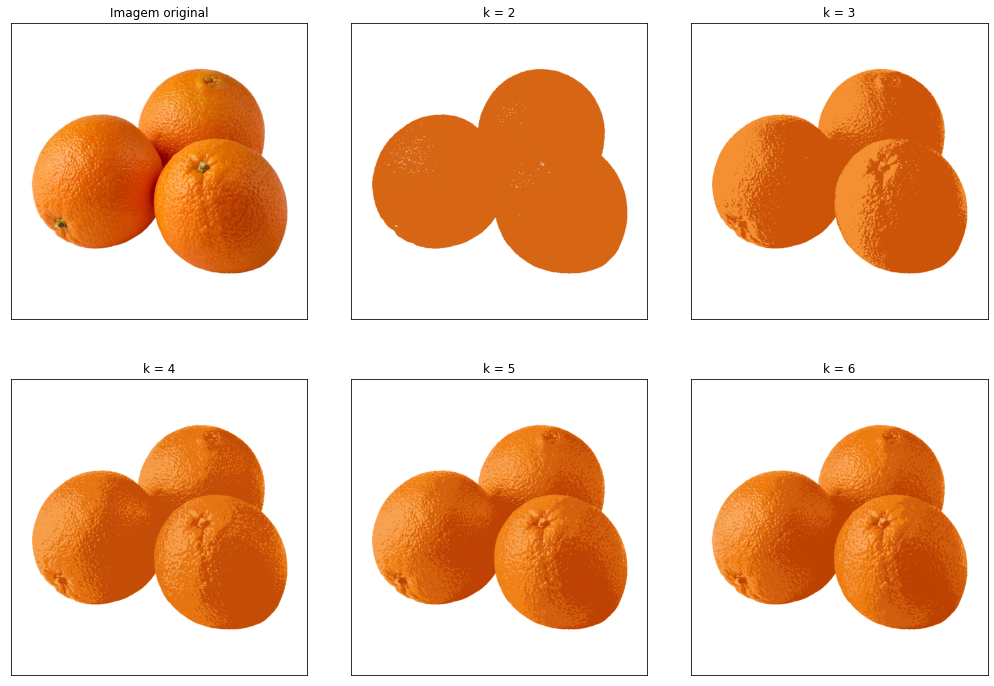

In [153]:
img = cv2.imread("/content/python_img_a_z/imagens/laranjas.jpg")
segmentacao_clustering(img)

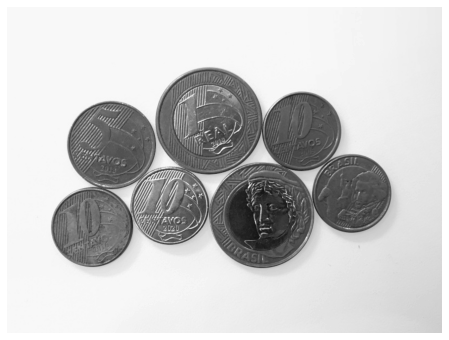

In [155]:
img = cv2.imread("/content/python_img_a_z/imagens/moedas03.jpg")
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
mostrar(gray)

174.0


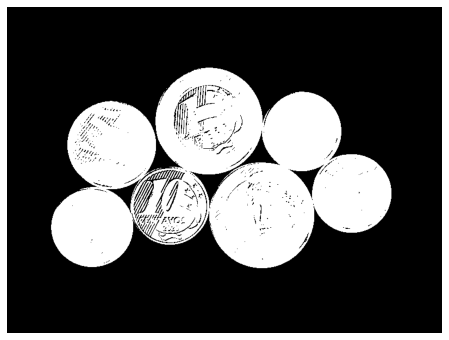

In [158]:
val, thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY_INV | cv2.THRESH_OTSU)
print(val)
mostrar(thresh)

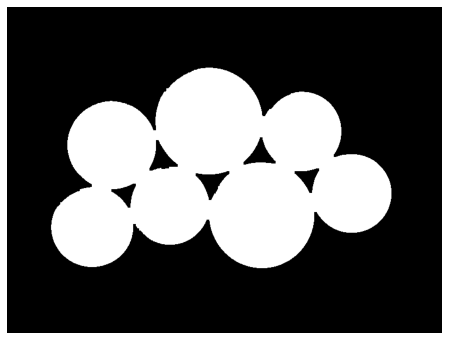

In [159]:
dilate = cv2.dilate(thresh, np.ones((3, 3), np.uint8), iterations=2)
seg = cv2.erode(dilate, np.ones((3,3), np.uint8), iterations=2)
mostrar(seg)

In [161]:
from scipy import ndimage as ndi
from skimage.feature import peak_local_max
from skimage.segmentation import watershed

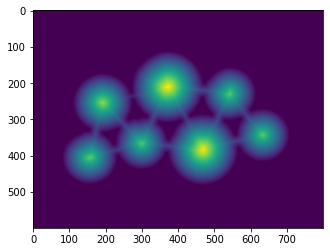

In [164]:
dist = ndi.distance_transform_edt(seg)
plt.imshow(dist);

In [165]:
img.shape

(600, 800, 3)

In [167]:
dist.shape

(600, 800)

In [168]:
dist[350]

array([ 0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.  

In [169]:
local_max = peak_local_max(dist, indices = False, min_distance = 20, labels = seg)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: FutureWarning: indices argument is deprecated and will be removed in version 0.20. To avoid this warning, please do not use the indices argument. Please see peak_local_max documentation for more details.
  """Entry point for launching an IPython kernel.


In [170]:
local_max, local_max.shape

(array([[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]]), (600, 800))

In [171]:
markers = ndi.label(local_max, structure=np.ones((3,3)))[0]

In [172]:
markers.shape

(600, 800)

In [173]:
markers, np.unique(markers, return_counts=True)

(array([[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]], dtype=int32),
 (array([0, 1, 2, 3, 4, 5, 6, 7], dtype=int32),
  array([479993,      1,      1,      1,      1,      1,      1,      1])))

In [174]:
labels = watershed(-dist, markers, mask=seg)

In [175]:
np.unique(labels)

array([0, 1, 2, 3, 4, 5, 6, 7], dtype=int32)

In [176]:
labels.shape


(600, 800)

In [177]:
labels[280]

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,

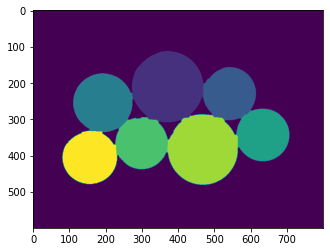

In [178]:
plt.imshow(labels);

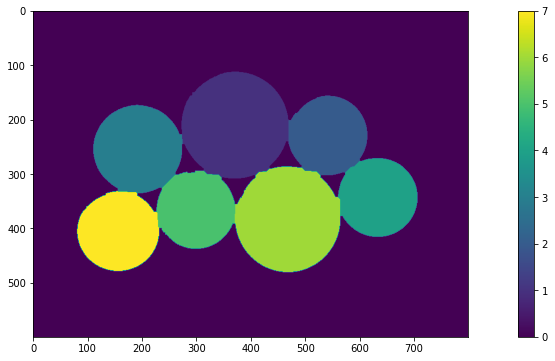

In [179]:
fig = plt.gcf()
fig.set_size_inches(18,6)
plot = plt.imshow(labels)
plt.colorbar(plot);

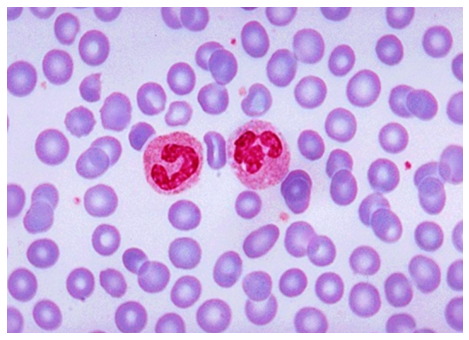

In [180]:
img = cv2.imread('/content/python_img_a_z/imagens/rbc.jpg')
mostrar(img)

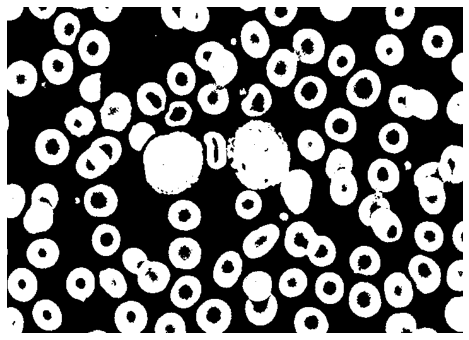

In [181]:
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY_INV | cv2.THRESH_OTSU)[1]
mostrar(thresh)

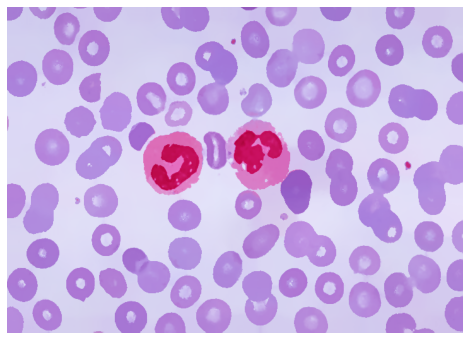

In [182]:
filtro = cv2.pyrMeanShiftFiltering(img, 20, 40)
mostrar(filtro)

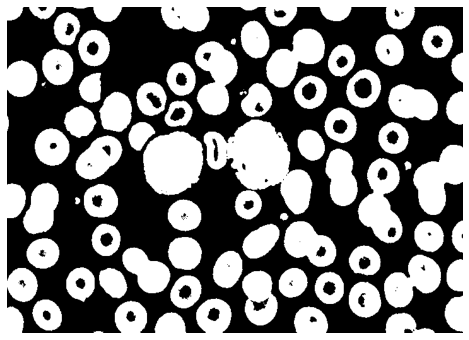

In [183]:
gray = cv2.cvtColor(filtro, cv2.COLOR_BGR2GRAY)
thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY_INV | cv2.THRESH_OTSU)[1]
mostrar(thresh)

In [184]:
def preenche_buracos(img_thresh, limiar = 1000):
  # 1 Detectar os contornos
  # 2 Verificar quais contornos estão abaixo do limiar
  # 3 Adicionaremos os contornos abaixo do limiar em uma lista
  # 4 Prencher os contornos pequenos
  contornos, _ = cv2.findContours(img_thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
  buracos = []
  for con in contornos:
    area = cv2.contourArea(con)
    if area < limiar:
      buracos.append(con)
  cv2.drawContours(img_thresh, buracos, -1, 255, -1)
  return img_thresh

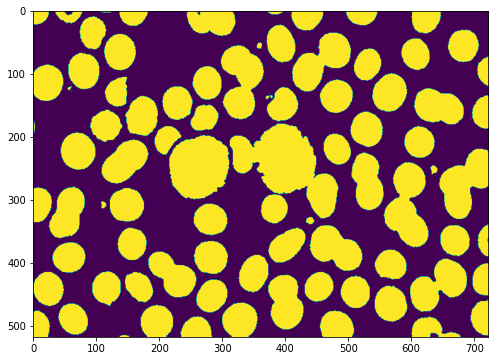

In [185]:
seg = preenche_buracos(thresh)
fig = plt.gcf()
fig.set_size_inches(18, 6)
plt.imshow(seg);

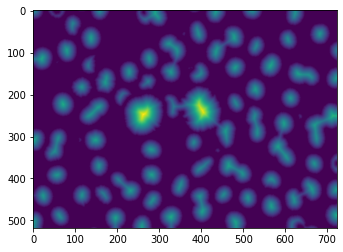

In [186]:
dist = ndi.distance_transform_edt(seg)
plt.imshow(dist);

In [187]:
local_max = peak_local_max(dist, indices=False, min_distance=20, labels=seg)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: FutureWarning: indices argument is deprecated and will be removed in version 0.20. To avoid this warning, please do not use the indices argument. Please see peak_local_max documentation for more details.
  """Entry point for launching an IPython kernel.


In [188]:
markers = ndi.label(local_max, structure=np.ones((3, 3)))[0]

In [189]:
labels = watershed(-dist, markers, mask=seg)

In [190]:
print("Segmentos únicos encontrados: {}".format(len(np.unique(labels)) - 1))

Segmentos únicos encontrados: 83


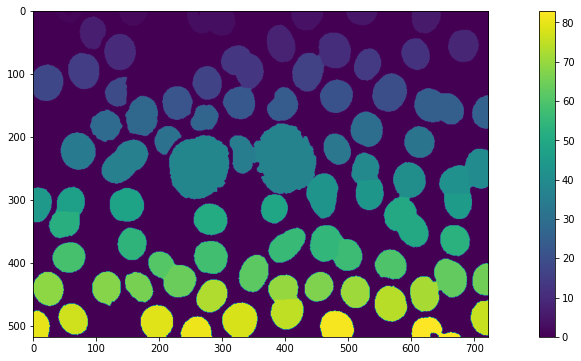

In [191]:
fig = plt.gcf()
fig.set_size_inches(18, 6)
plot = plt.imshow(labels)
plt.colorbar(plot);

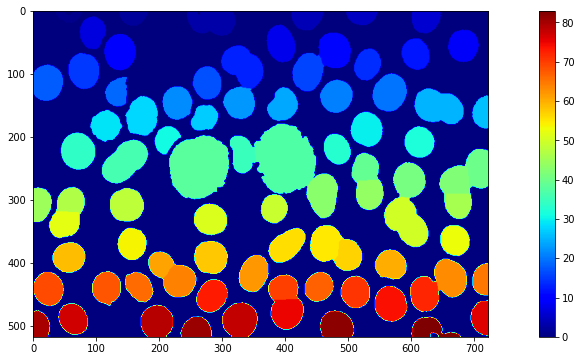

In [192]:
fig = plt.gcf()
fig.set_size_inches(18, 6)
plot = plt.imshow(labels, cmap='jet')
plt.colorbar(plot);

In [193]:
def segmentacao_watershed(img, preenchimento = 1000):
  original = gray = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  filtro = cv2.pyrMeanShiftFiltering(img, 20, 40)
  gray = cv2.cvtColor(filtro, cv2.COLOR_BGR2GRAY)
  thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY_INV | cv2.THRESH_OTSU)[1]

  if preenchimento > 0:
    thresh = preenche_buracos(thresh, preenchimento)

  dist = ndi.distance_transform_edt(thresh)
  dist_visual = dist.copy()
  local_max = peak_local_max(dist, indices=False, min_distance=20, labels=thresh)
  markers = ndi.label(local_max, structure=np.ones((3, 3)))[0]
  labels = watershed(-dist, markers, mask=thresh)

  titulos = ['Imagem Original', 'Limiarização (objetos juntos)', 'Distance Transform', 'Watershed (objetos separados)']
  imagens = [original, thresh, dist_visual, labels]

  fig = plt.gcf()
  fig.set_size_inches(16, 12)  
  for i in range(4):
      plt.subplot(2,2,i+1)
      # condição para colocar colormap jet apenas pra imagem com o resultado do watershed
      if (i == 3):
        cmap = "jet" 
      else:
        cmap = "gray"
      plt.imshow(imagens[i], cmap)
      plt.title(titulos[i]) 
      plt.xticks([]),plt.yticks([])     
  plt.show()
  return labels

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: FutureWarning: indices argument is deprecated and will be removed in version 0.20. To avoid this warning, please do not use the indices argument. Please see peak_local_max documentation for more details.
  if sys.path[0] == '':


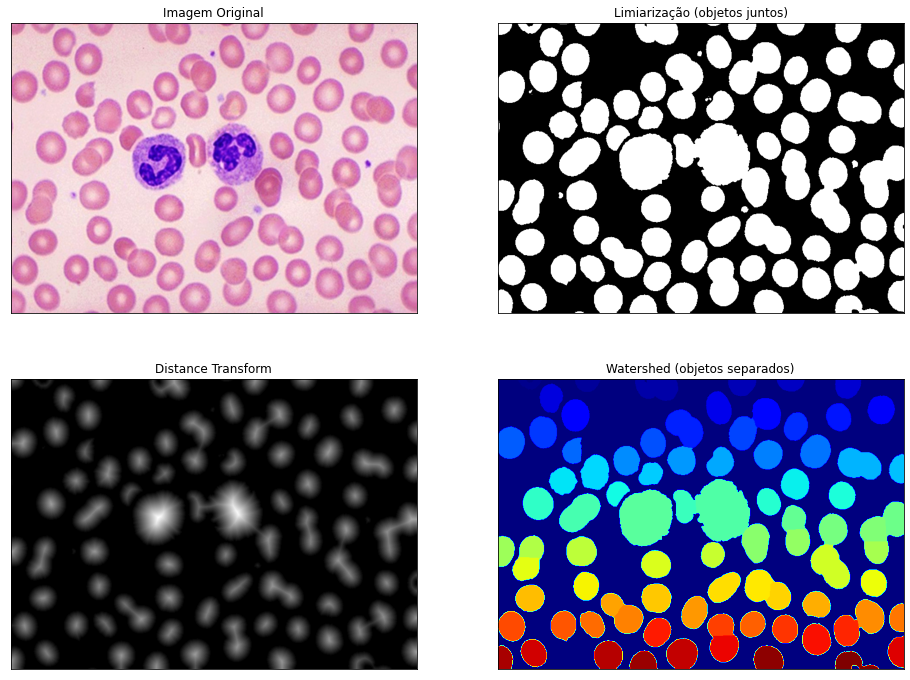

In [195]:
img = cv2.imread('/content/python_img_a_z/imagens/rbc.jpg')
segmentacao = segmentacao_watershed(img)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: FutureWarning: indices argument is deprecated and will be removed in version 0.20. To avoid this warning, please do not use the indices argument. Please see peak_local_max documentation for more details.
  if sys.path[0] == '':


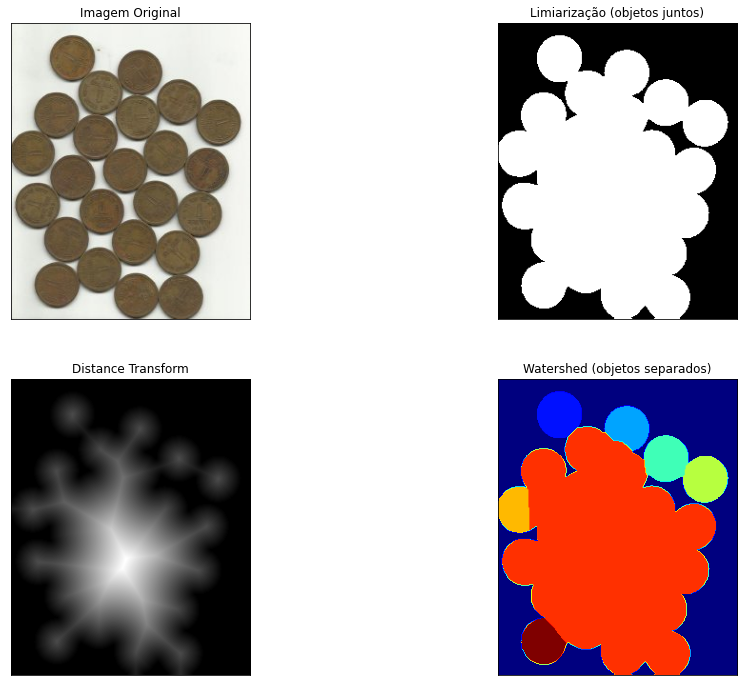

In [197]:
img = cv2.imread('/content/python_img_a_z/imagens/moedas04.jpg')
segmentacao = segmentacao_watershed(img)

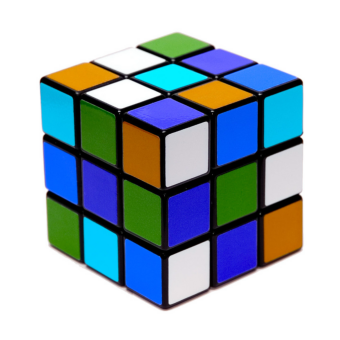

In [198]:
img = cv2.imread('/content/python_img_a_z/imagens/cubo_magico.jpg')
mostrar(img)

In [199]:
# BGR
cor_min = (90, 10, 0)
cor_max = (255, 180, 40)

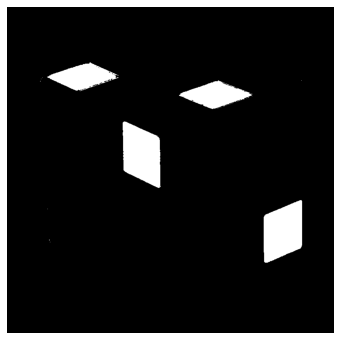

In [200]:
mascara = cv2.inRange(img, cor_min, cor_max)
mostrar(mascara)

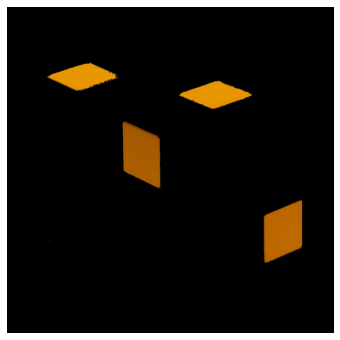

In [201]:
segmento_cor = cv2.bitwise_and(img, img, mask = mascara)
mostrar(segmento_cor)

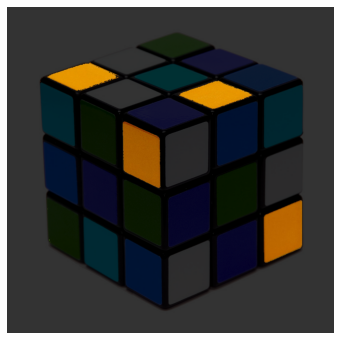

In [202]:
seg_sobreposicao = cv2.addWeighted(segmento_cor, 0.8, img, 0.2, 0)
mostrar(seg_sobreposicao)

In [203]:
cores = [
  ([90, 10, 0], [255, 180, 40]),    # azul
  ([0, 80, 0], [120, 255, 120]),    # verde
  ([8, 8, 160], [120, 120, 255]),   # vermelho
  ([0, 150, 200], [10, 255, 255]),  # amarelo
  ([0, 80, 240], [80, 165, 255]),   # laranja
]

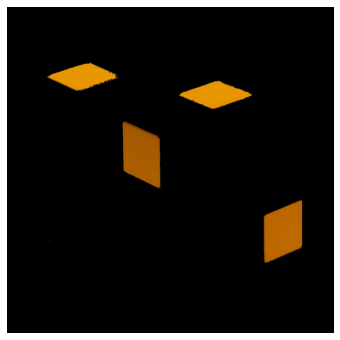

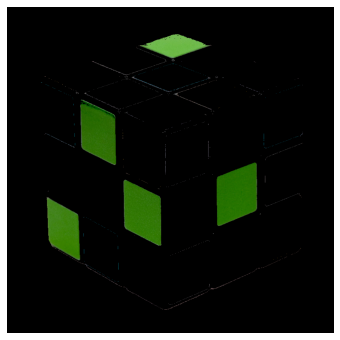

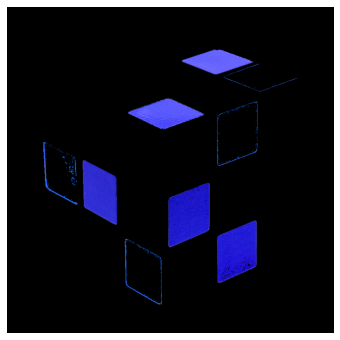

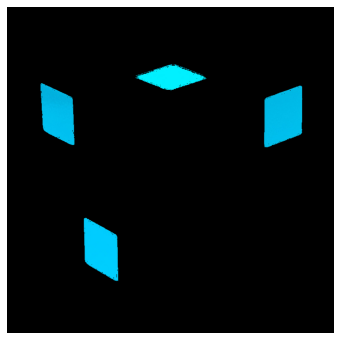

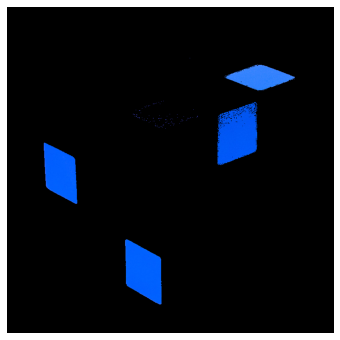

In [204]:
for (minimo, maximo) in cores:
  #print(minimo, maximo)
  minimo = np.array(minimo, dtype = 'uint8')
  maximo = np.array(maximo, dtype = 'uint8')
  mascara = cv2.inRange(img, minimo, maximo)
  segmento = cv2.bitwise_and(img, img, mask = mascara)
  mostrar(segmento)

In [205]:
img = cv2.imread('/content/python_img_a_z/imagens/cubo_magico.jpg')
img_hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

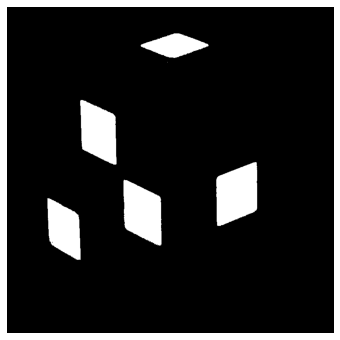

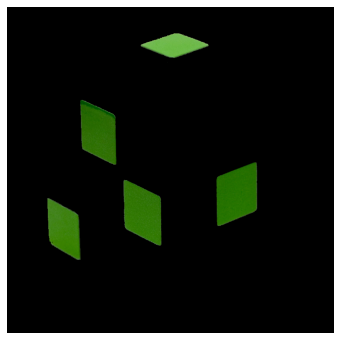

In [206]:
minimo = (45, 80, 40)
maximo = (75, 255, 255)
mascara = cv2.inRange(img_hsv, minimo, maximo)
mostrar(mascara)
segmento = cv2.bitwise_and(img, img, mask = mascara)
mostrar(segmento)

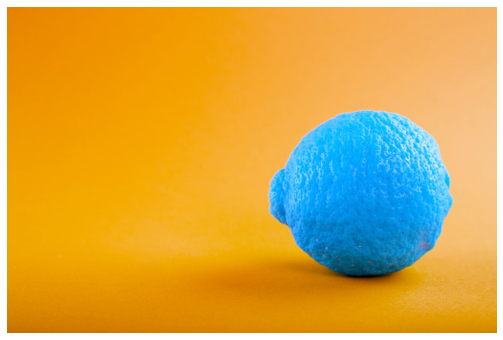

In [207]:
img = cv2.imread('/content/python_img_a_z/imagens/limao_amarelo.jpg')
img_hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
mostrar(img)

In [208]:
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm
from matplotlib import colors

In [209]:
img.shape

(533, 800, 3)

In [210]:
cores_pixels = img.reshape((np.shape(img)[0] * np.shape(img)[1], 3))
cores_pixels.shape

(426400, 3)

In [211]:
norm = colors.Normalize(vmin=-1., vmax=1.)
norm.autoscale(cores_pixels)
cores_pixels = norm(cores_pixels).tolist()

In [212]:
cores_pixels

[[0.9019607901573181, 0.5058823823928833, 0.0],
 [0.9019607901573181, 0.5058823823928833, 0.0],
 [0.9019607901573181, 0.5058823823928833, 0.0],
 [0.9019607901573181, 0.5058823823928833, 0.0],
 [0.9019607901573181, 0.5058823823928833, 0.0],
 [0.9019607901573181, 0.5058823823928833, 0.0],
 [0.9019607901573181, 0.5058823823928833, 0.0],
 [0.9019607901573181, 0.5058823823928833, 0.0],
 [0.9058823585510254, 0.5098039507865906, 0.003921568859368563],
 [0.9058823585510254, 0.5098039507865906, 0.003921568859368563],
 [0.9058823585510254, 0.5098039507865906, 0.003921568859368563],
 [0.9098039269447327, 0.5137255191802979, 0.007843137718737125],
 [0.9058823585510254, 0.5098039507865906, 0.003921568859368563],
 [0.9058823585510254, 0.5098039507865906, 0.003921568859368563],
 [0.9058823585510254, 0.5098039507865906, 0.003921568859368563],
 [0.9058823585510254, 0.5098039507865906, 0.003921568859368563],
 [0.9058823585510254, 0.5098039507865906, 0.003921568859368563],
 [0.9058823585510254, 0.5098039

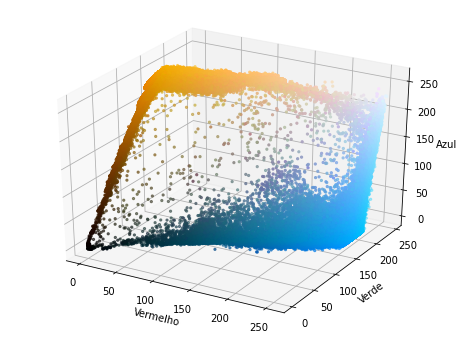

In [213]:
rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
r, g, b = cv2.split(rgb)
fig = plt.figure()
fig.set_size_inches(8,6)
axis = fig.add_subplot(1,1,1,projection='3d')
axis.scatter(r.flatten(), g.flatten(), b.flatten(), facecolors=cores_pixels, marker='.')
axis.set_xlabel('Vermelho')
axis.set_ylabel('Verde')
axis.set_zlabel('Azul');

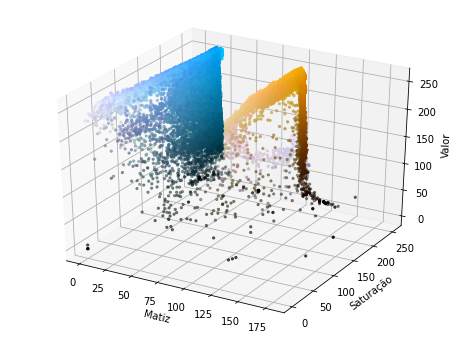

In [214]:
h, s, v = cv2.split(img_hsv)
fig = plt.figure()
fig.set_size_inches(8, 6)
axis = fig.add_subplot(1, 1, 1, projection="3d")
axis.scatter(h.flatten(), s.flatten(), v.flatten(), facecolors=cores_pixels, marker=".")
axis.set_xlabel("Matiz")
axis.set_ylabel("Saturação")
axis.set_zlabel("Valor");

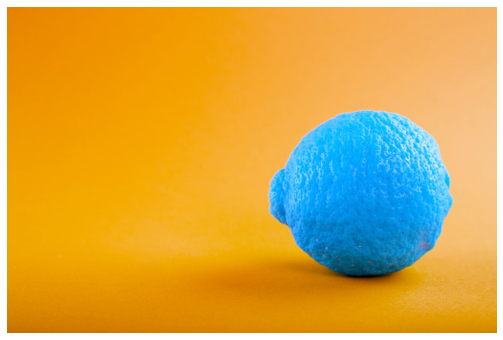

In [216]:
img = cv2.imread('/content/python_img_a_z/imagens/limao_amarelo.jpg')
img_hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
mostrar(img)

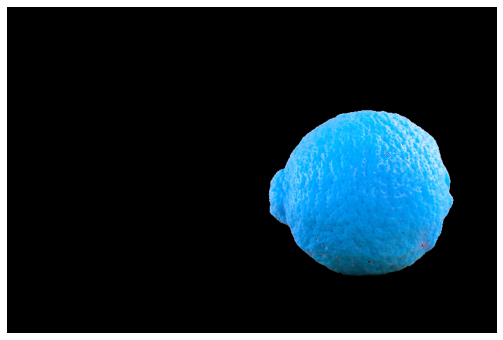

In [217]:
minimo = (0, 20, 20)
maximo = (30, 255, 255)
minimo = np.array(minimo, dtype = "uint8")
maximo = np.array(maximo, dtype = "uint8")
mascara = cv2.inRange(img_hsv, minimo, maximo)
segmento = cv2.bitwise_and(img, img, mask = mascara)
mostrar(segmento)

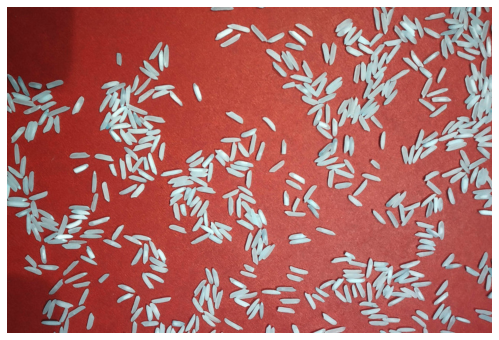

In [218]:
img = cv2.imread("/content/python_img_a_z/imagens/graos_arroz.jpg")
img_hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
mostrar(img)

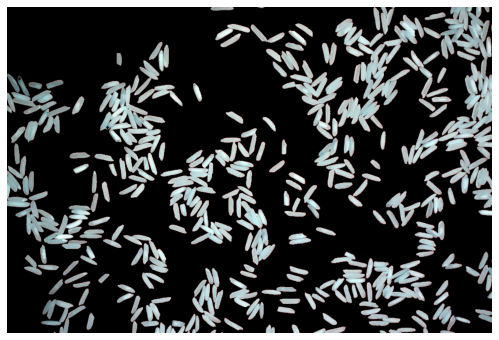

In [219]:
minimo = (0, 0, 0)
maximo = (180, 100, 255)
minimo = np.array(minimo, dtype = "uint8")
maximo = np.array(maximo, dtype = "uint8")
mascara = cv2.inRange(img_hsv, minimo, maximo)
segmento = cv2.bitwise_and(img, img, mask = mascara)
mostrar(segmento)

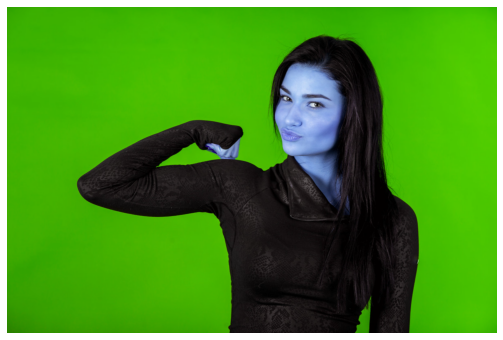

In [220]:
img = cv2.imread("/content/python_img_a_z/imagens/chromakey.jpg")
img_hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
mostrar(img)

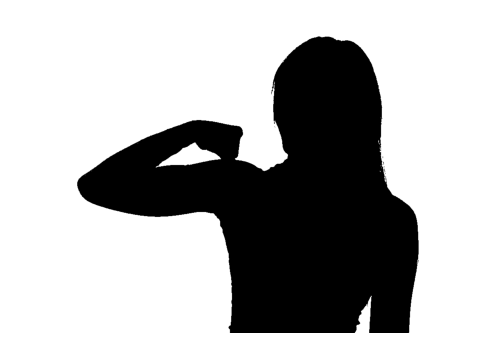

In [221]:
minimo = (40, 80, 40)
maximo = (80, 255, 255)
minimo = np.array(minimo, dtype = "uint8")
maximo = np.array(maximo, dtype = "uint8")
mascara = cv2.inRange(img_hsv, minimo, maximo)
mostrar(mascara)

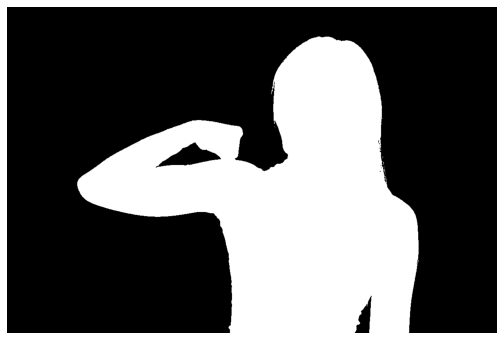

In [222]:
mascara = 255 - mascara
mostrar(mascara)

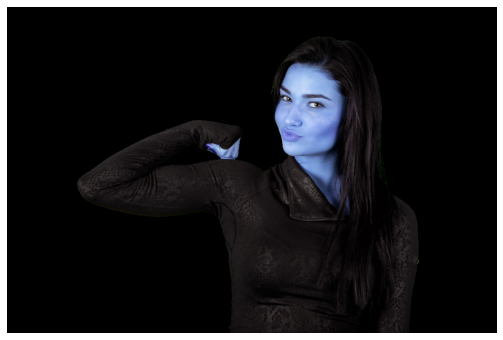

In [223]:
segmento = cv2.bitwise_and(img, img, mask = mascara)
mostrar(segmento)

In [224]:
altura, largura = img.shape[:2]
print(altura, largura)

800 1200


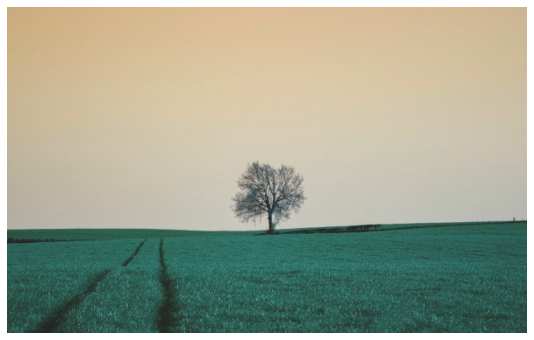

In [225]:
img_final = img.copy()
fundo = cv2.imread('/content/python_img_a_z/imagens/paisagem01.jpg')
mostrar(fundo)

In [226]:
fundo.shape

(389, 620, 3)

In [227]:
fundo = cv2.resize(fundo, (largura, altura))
fundo.shape

(800, 1200, 3)

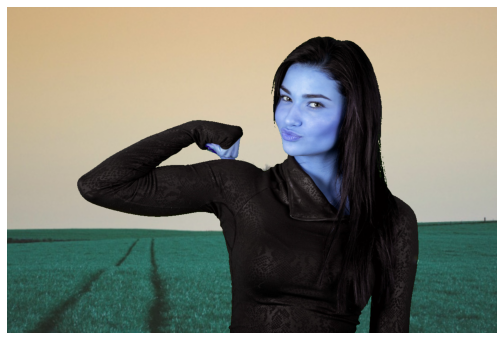

In [228]:
img_final[mascara == 0] = fundo[mascara == 0]
mostrar(img_final)

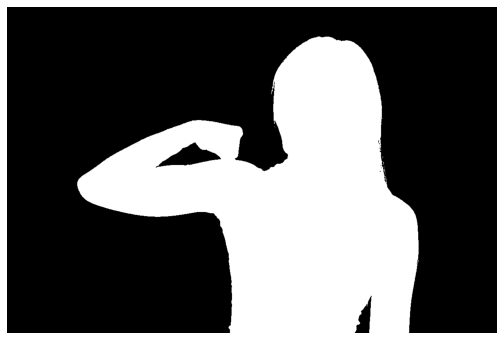

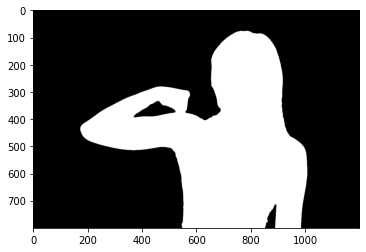

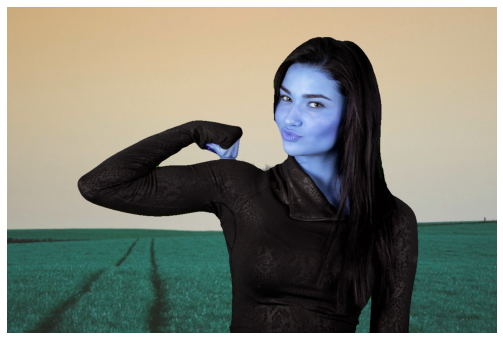

In [229]:
mostrar(mascara)
import skimage.exposure
mascara_suave = mascara.copy()
mascara_suave = cv2.GaussianBlur(mascara_suave, (0,0), sigmaX=3, sigmaY=3, borderType = cv2.BORDER_DEFAULT)
mascara_suave = skimage.exposure.rescale_intensity(mascara_suave, in_range=(150,190), out_range=(0,255))
plt.imshow(mascara_suave, cmap='gray')
plt.show()

img_final = img.copy()
img_final[mascara_suave == 0] = fundo[mascara_suave == 0]
mostrar(img_final)